In [1]:
### IMPORT SCIENTIFIC LIBRARIES ###
import numpy as np
import pandas as pd
from scipy import sparse
from scipy.optimize import curve_fit
import importlib

import matplotlib.pyplot as plt
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18
#%matplotlib widget

import os, sys, importlib, gc
sys.path.append('./XPCS_library/')

import ID10_tools as ID10
from ID10_tools import Nx, Ny, Npx
ID10.set_version('v2')
importlib.reload(ID10)

import XPCS_tools as XPCS
from XPCS_tools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAY_tools as COSMIC
COSMIC.set_beamline('ID10')

# RAW FOLDER PATH
raw_folder = '../RAW_DATA/'
mask_folder = '../masks/'
fit_out_folder = './data/fit_outs/'
Idt_folder = './data/Idts/'
g2_folder = './data/g2/'

# EXPERIMENTAL VARIABLES
XPCS.set_expvar(1350, 1350, 7)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000

## Load masks

In [2]:
e4m_htmask = np.load(mask_folder+'e4m_htmask_copper_foil_30um_1_1'+'.npy')
e4m_mask = np.load(mask_folder+'e4m_mask'+'.npy')

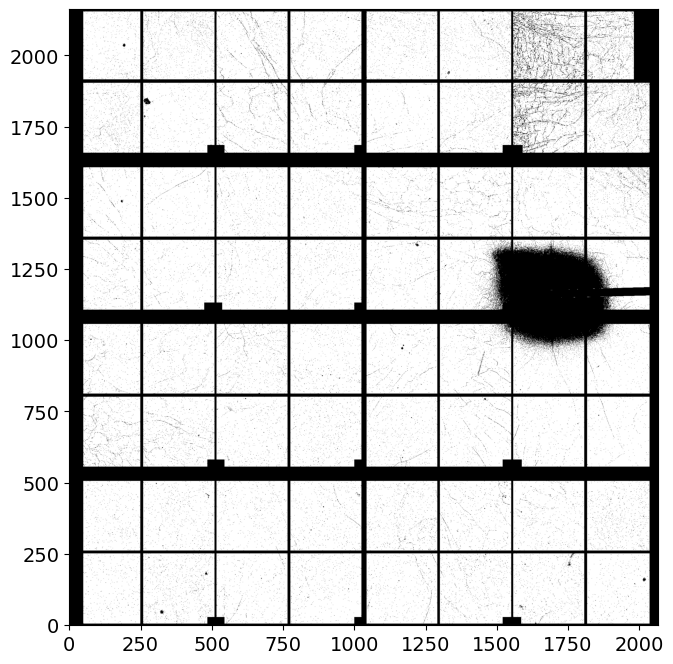

In [3]:
plt.figure(figsize=(8, 8))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')

### BS mask and Q definition
Using a random scan in GeO2_6, because we are not changing the measurement configuration

#### Beamstop mask

In [4]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
Nfi, Nff = 0, 10000
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/3 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/3 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/3 loops)
Done! (elapsed time = 0.11 s)
Concatenating vectors ...
Done! (elapsed time = 0.04 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_7_30C/GeO2_7_30C_0003/scan0003/
	 | Shape:       (10000, 4471016)
	 | Sparsity:     1.6e-04
	 | Memory usage (scipy.csr_array): 0.080 GB (np.array usage: 166.558 GB)


################################################################################
Maximum count in the hull run -> 253.0
# of pixels above Ith_high treshold ->  78 pixels (of 4471016 => 0.0 %)
################################################################################



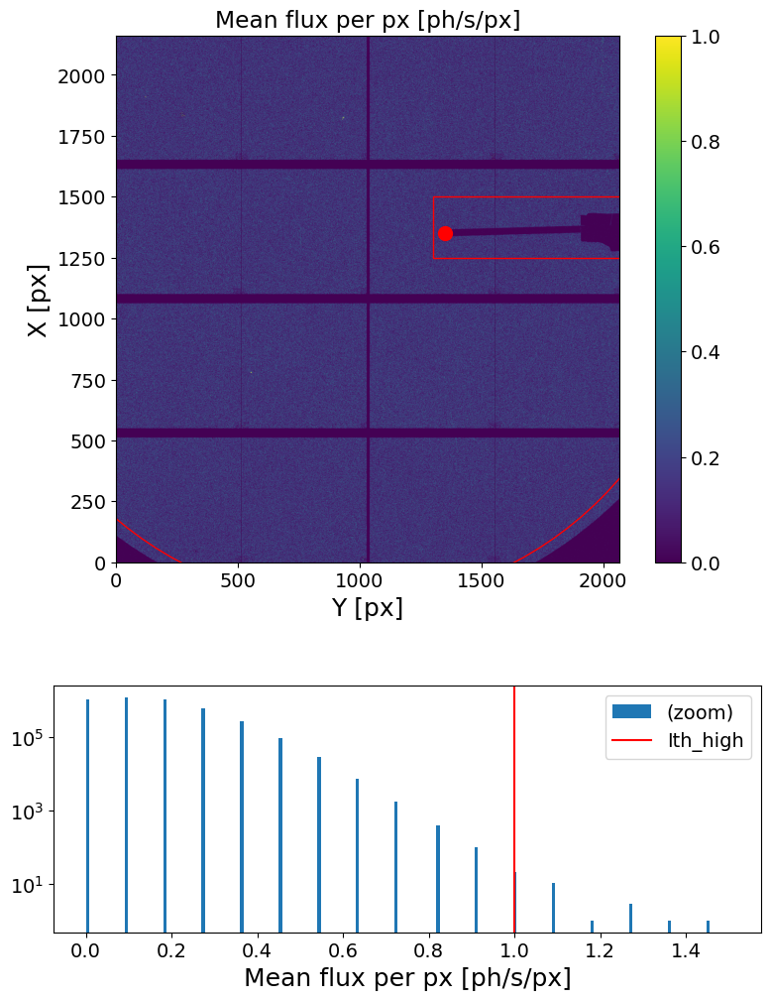

In [5]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=1, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



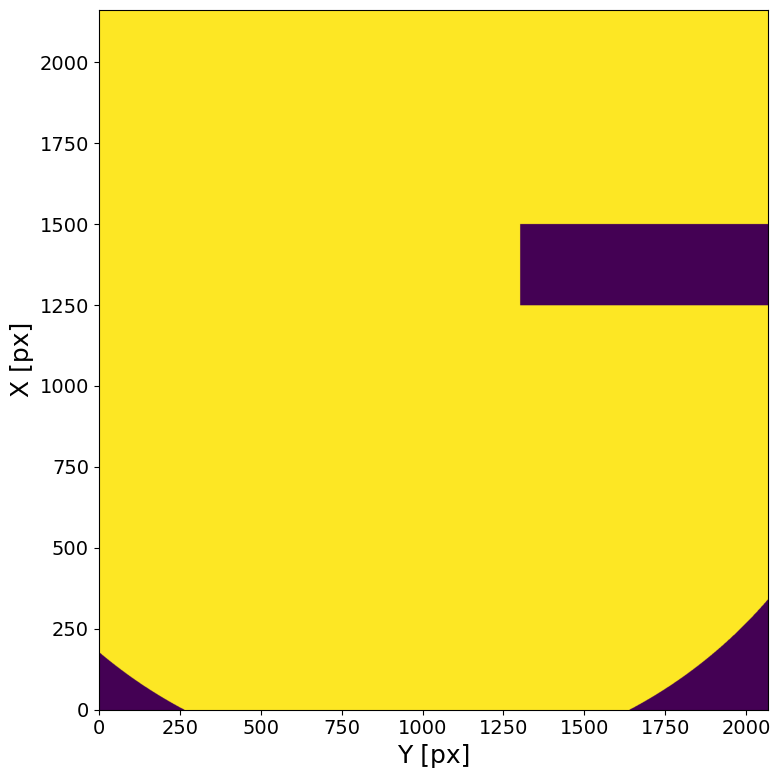

In [6]:
bs_mask = XPCS.gen_mask(e4m_data, itime, mask=None, mask_geom=geom)

#### Q mask

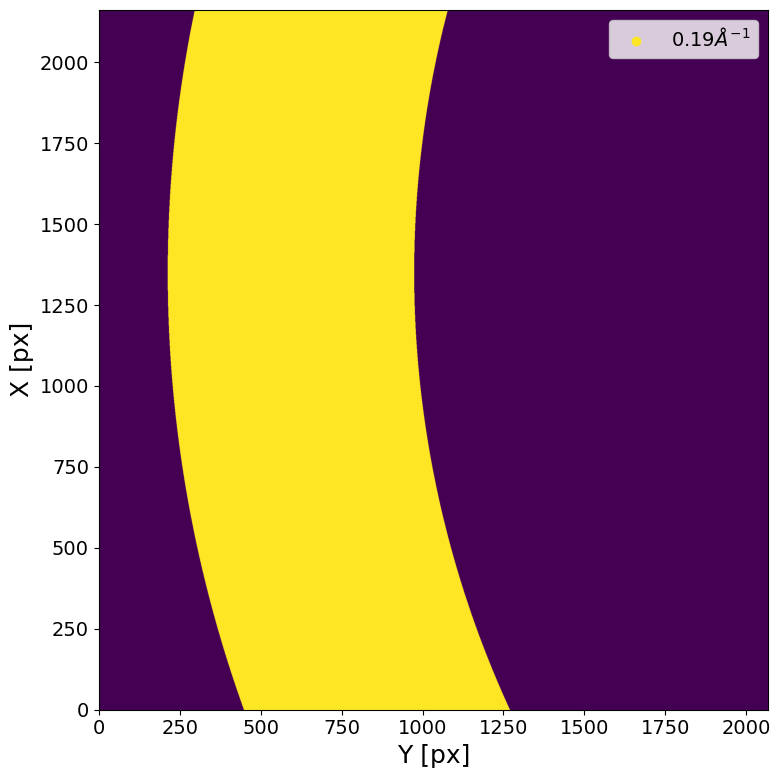

In [7]:
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

## XPCS scan (T = 30C Q =  0.19 Å, 30 min @ 1ms (1_800_000fm)) (GeO2_7, dataset 3, scan 3) fresh point

In [8]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask*e4m_htmask*bs_mask*Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff, load_mask=load_mask, n_jobs=60, )
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
 eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loo

	 -> loading file eiger4m_v2_sparse_frame_0_00212.h5 (213/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00213.h5 (214/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00214.h5 (215/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00215.h5 (216/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00216.h5 (217/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00217.h5 (218/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00218.h5 (219/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00219.h5 (220/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00220.h5 (221/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00221.h5 (222/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00222.h5 (223/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00223.h5 (224/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00224.h5 (225/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00225.h5 (226/361 loops)
	 -> loading file eiger4m_v2_spars

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3049983 pixels (of 4471016 => 68.22 %)
################################################################################



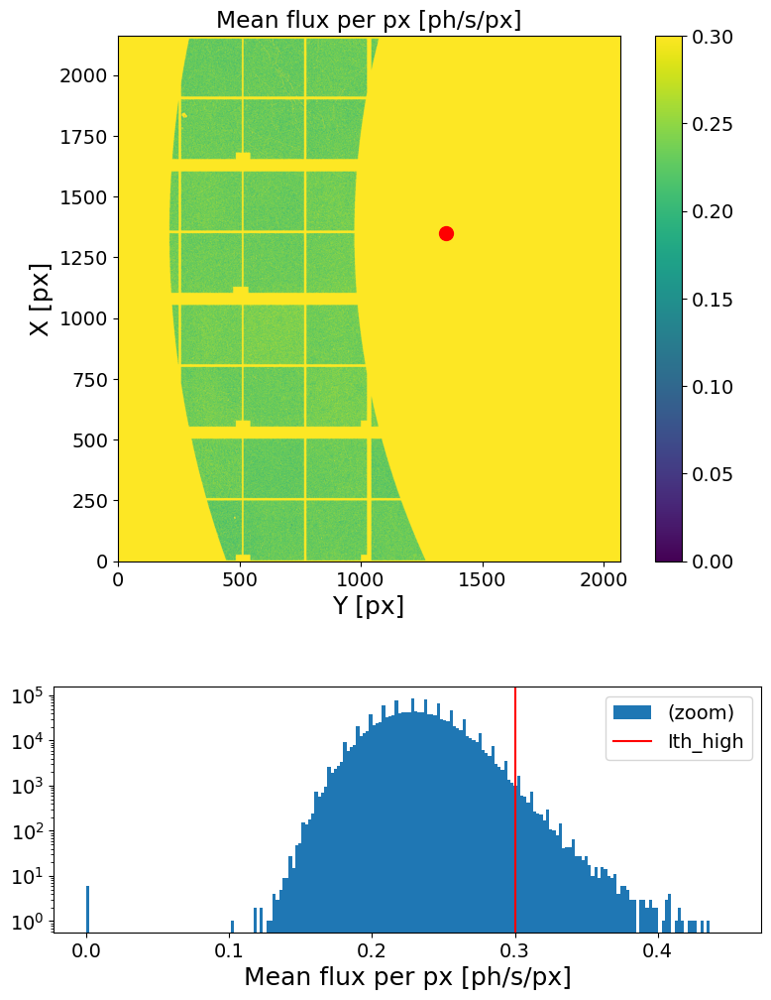

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

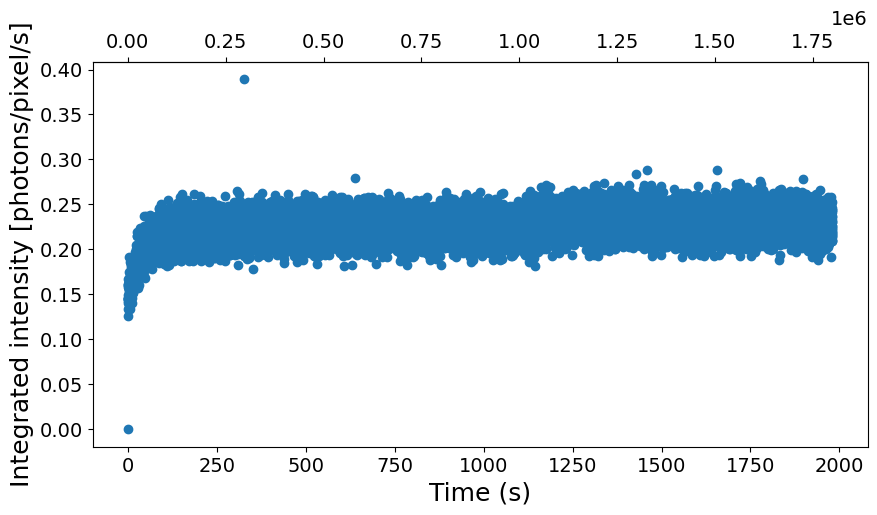

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [12]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [ ]:
##### INPUTS #####
Nfi = 60000
Nff = 60000 + 3*2**19
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)

Loading frames ...
Done! (elapsed time = 7.26 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 2.48e-04
	 | memory usage (sparse.csr_array @ float32) = 6.24 GB
Computing sparse multitau G2t...


100%|██████████| 384/384 [02:25<00:00,  2.64it/s]


Done! (elapsed time = 146.93 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:01<00:00,  3.51it/s]

Done! (elapsed time = 3.33 s)


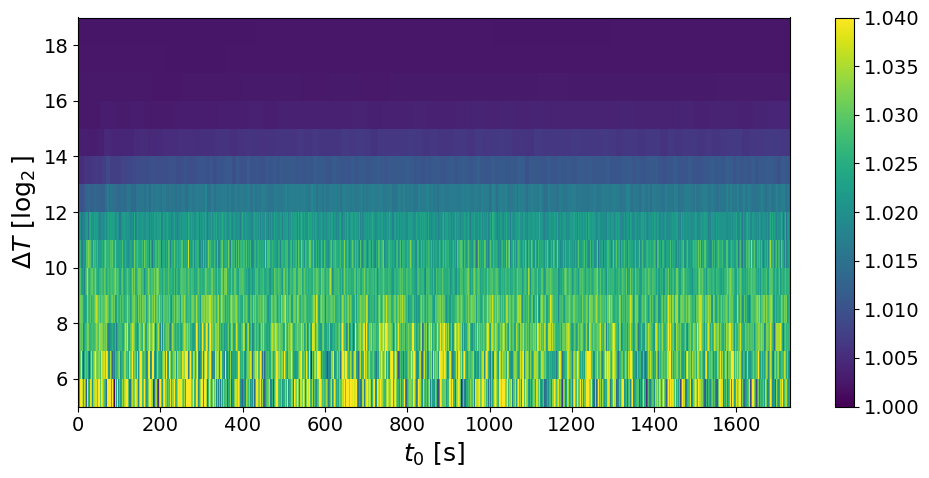

In [15]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [16]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

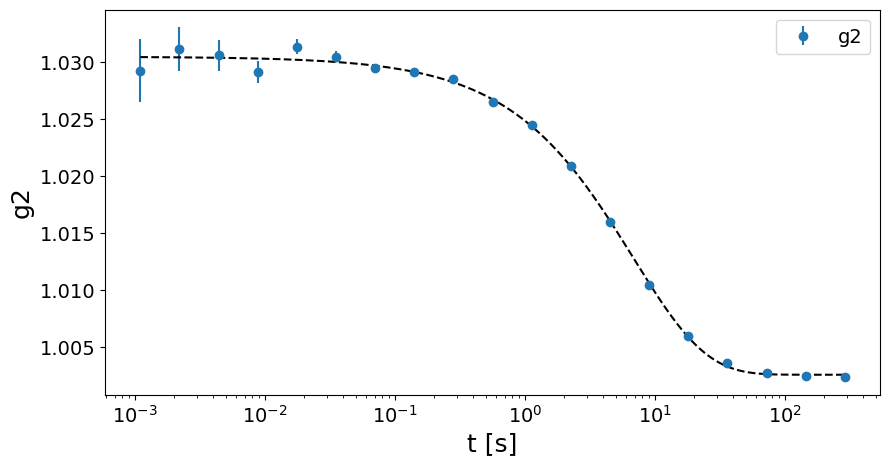

####### Fit parameters #######
tau = 6.8039 +/- 0.3758 s
beta = 0.7782 +/- 0.0388
c = 0.0279 +/- 0.0004
y0 = 1.0026 +/- 0.0003


In [18]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 100C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [19]:
#######################################
sample_name = 'GeO2_7_100C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00025.h5eiger4m_v2_sparse_frame_0_00023.h5  (26/361 loops)(24/361 loops)

	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00038.h5 (39/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00000.h5eiger4m_v2_sparse_frame_0_00001.h5  (1/361 loops)(2/361 loops)

	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3045554 pixels (of 4471016 => 68.12 %)
################################################################################



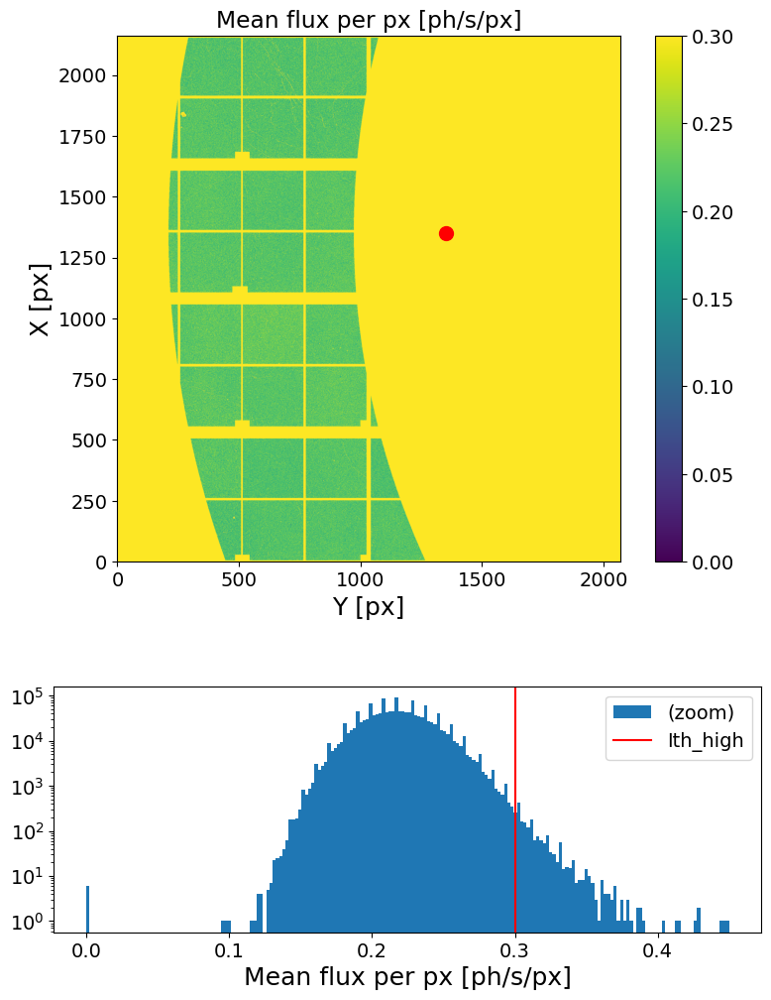

In [20]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [21]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

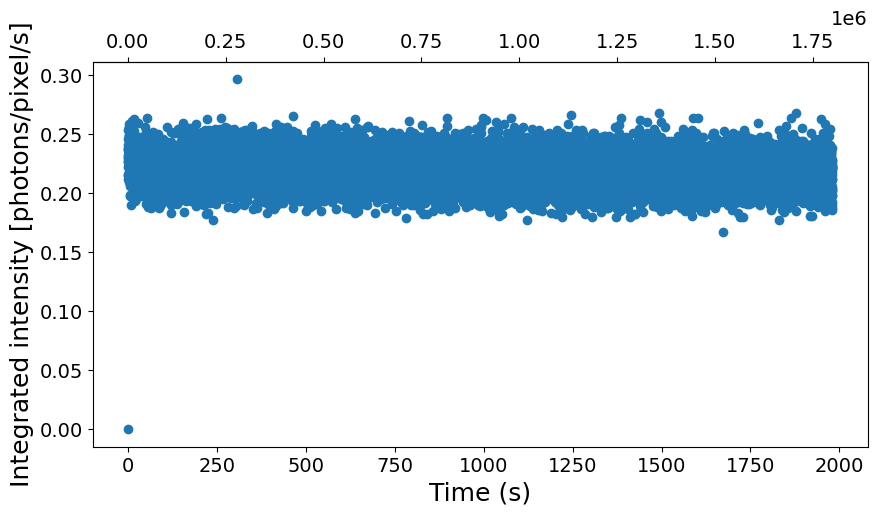

In [25]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [23]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [26]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**19
sparse_depth = 11
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 6.39 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 2.42e-04
	 | memory usage (sparse.csr_array @ float32) = 6.082 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [02:23<00:00,  5.36it/s]


Done! (elapsed time = 143.25 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

Done! (elapsed time = 6.08 s)


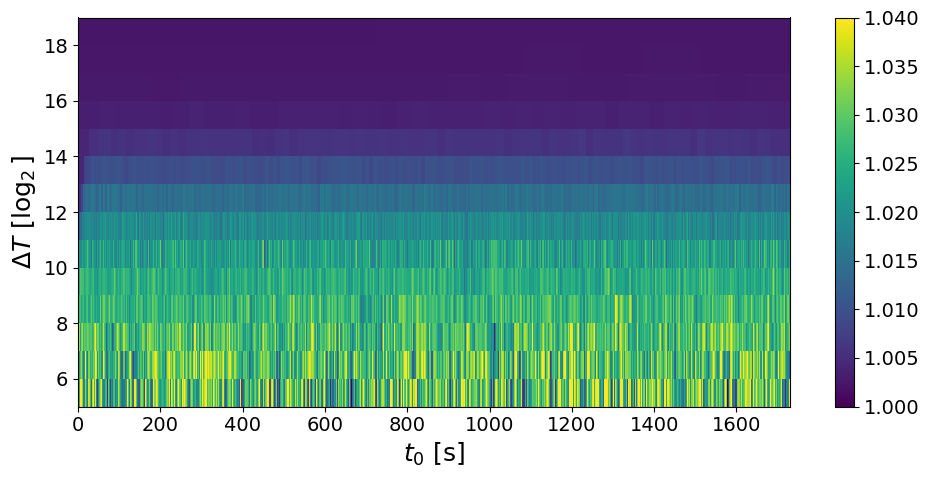

In [27]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [28]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

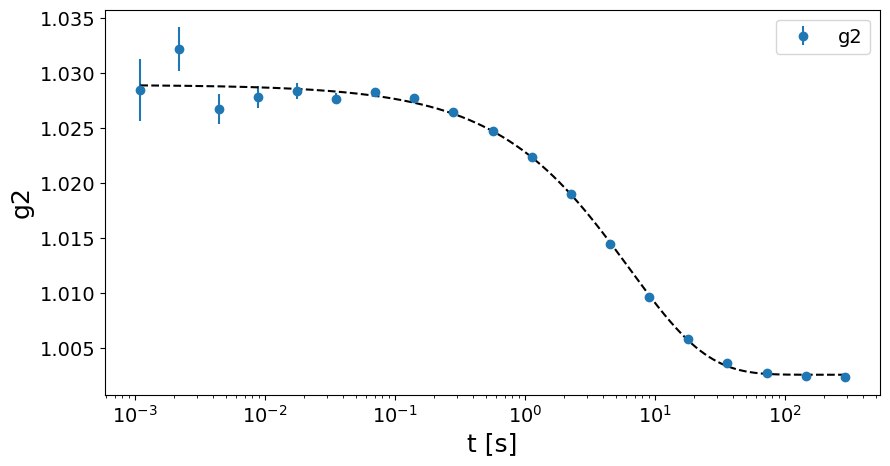

####### Fit parameters #######
tau = 6.3186 +/- 0.7074 s
beta = 0.7235 +/- 0.0688
c = 0.0264 +/- 0.0008
y0 = 1.0026 +/- 0.0006


In [29]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 170C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [9]:
#######################################
sample_name = 'GeO2_7_170C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...


	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3044289 pixels (of 4471016 => 68.09 %)
################################################################################



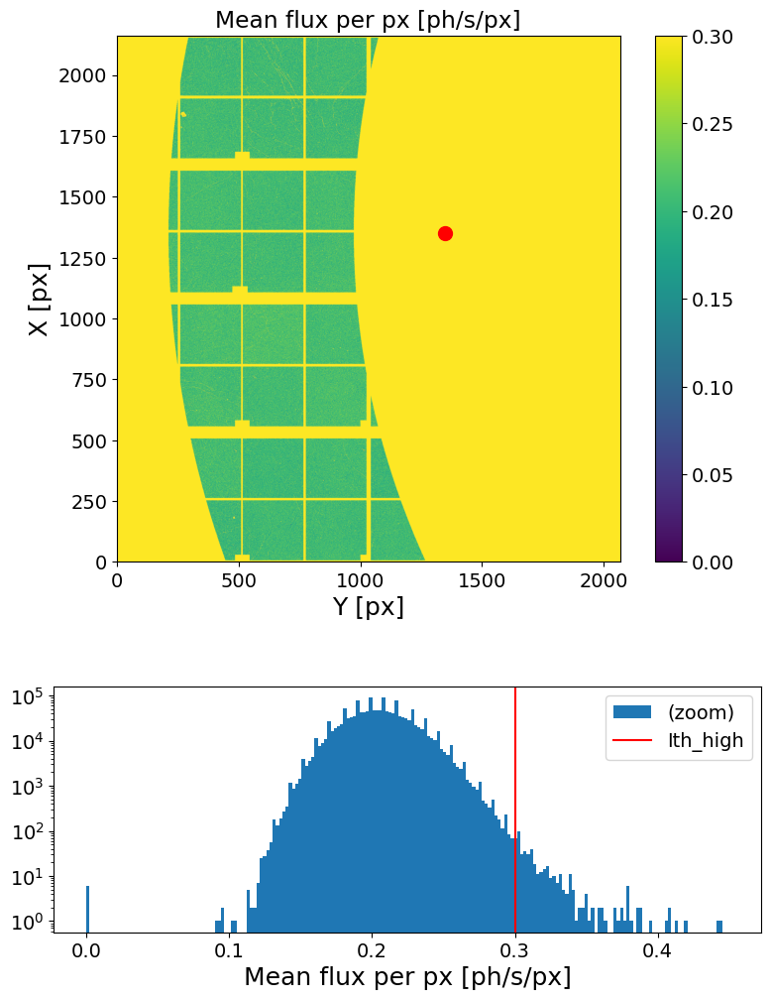

In [10]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [11]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

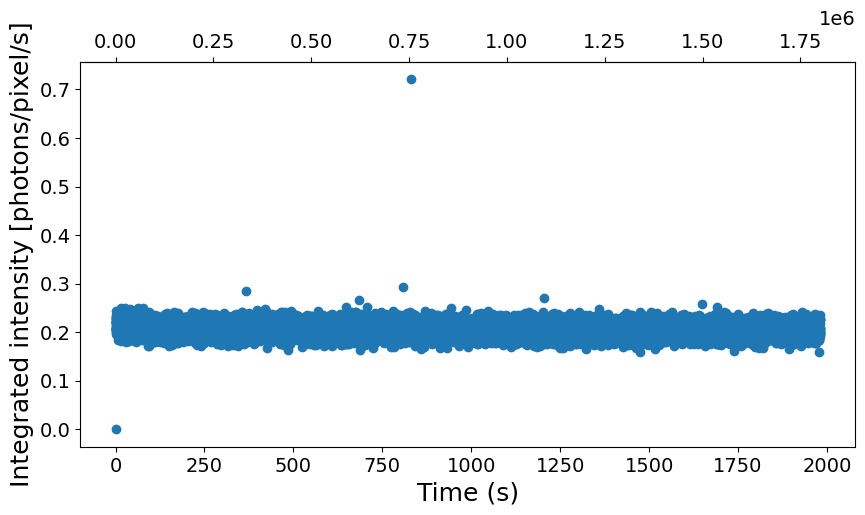

In [12]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [13]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [14]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**19
sparse_depth = 11
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 6.97 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 2.27e-04
	 | memory usage (sparse.csr_array @ float32) = 5.714 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [02:55<00:00,  4.37it/s]


Done! (elapsed time = 175.93 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:04<00:00,  1.96it/s]

Done! (elapsed time = 5.21 s)


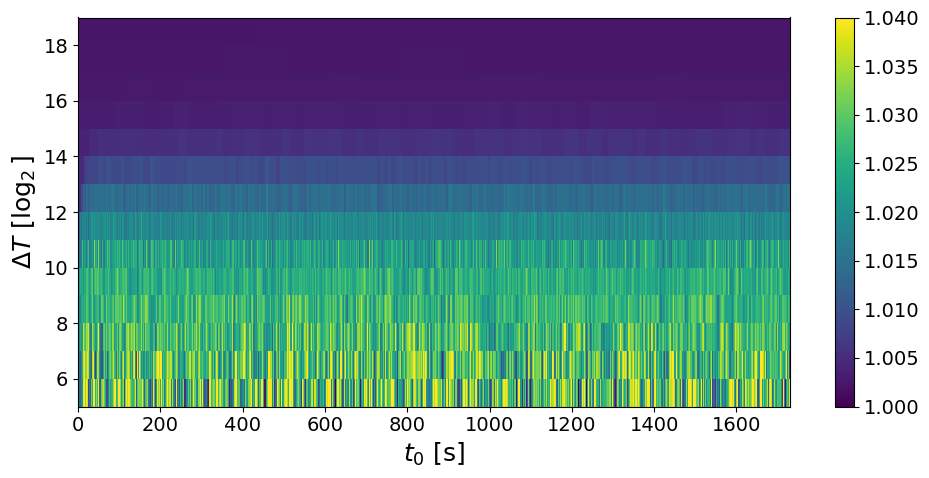

In [15]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [16]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

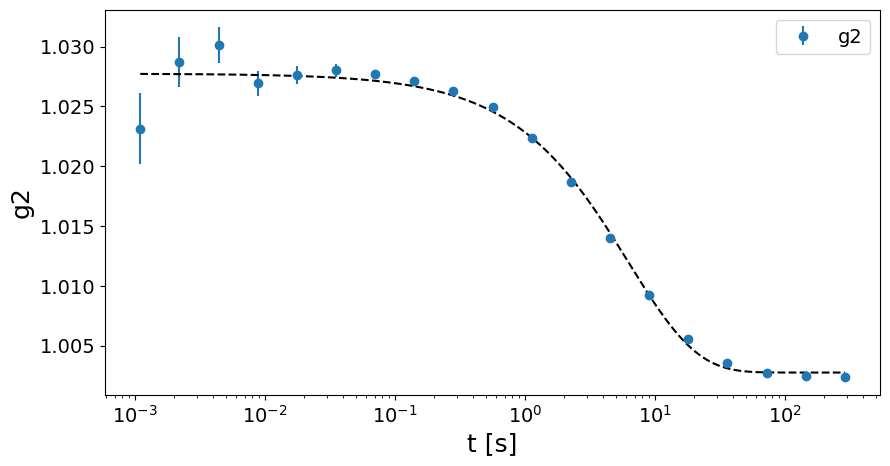

####### Fit parameters #######
tau = 6.2739 +/- 0.8796 s
beta = 0.8294 +/- 0.1123
c = 0.025 +/- 0.001
y0 = 1.0028 +/- 0.0007


In [17]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 240C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [19]:
#######################################
sample_name = 'GeO2_7_240C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00046.h5 (47/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/36

### Flux check

################################################################################
Maximum count in the hull run -> 4.0
# of pixels above Ith_high treshold ->  3044116 pixels (of 4471016 => 68.09 %)
################################################################################



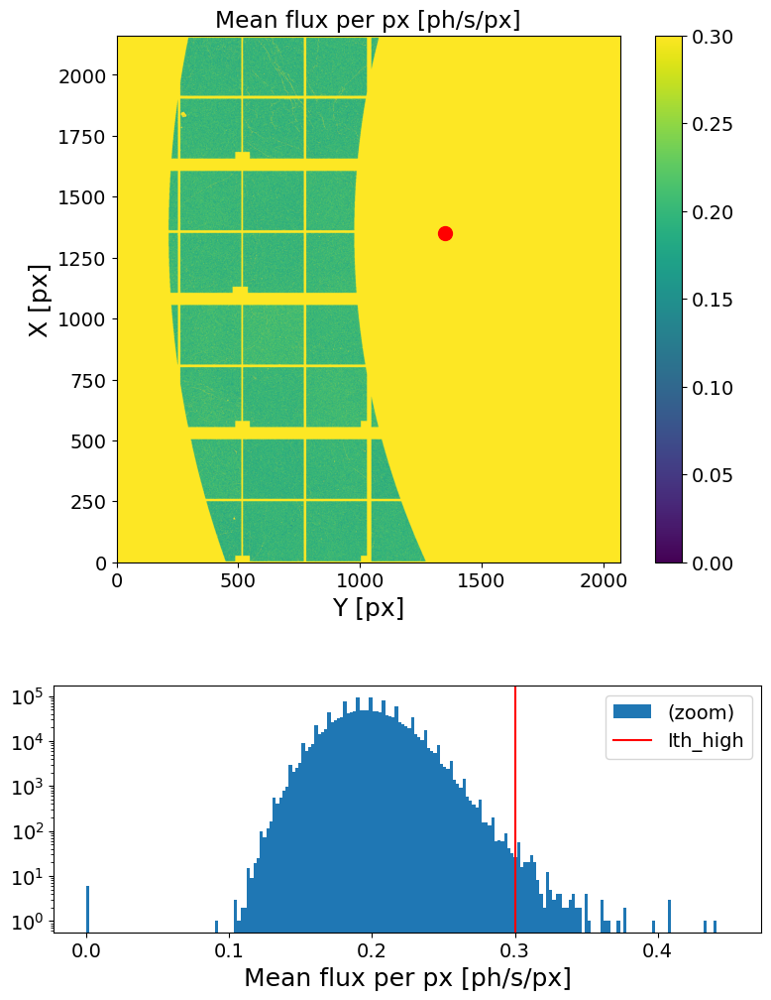

In [20]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [21]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

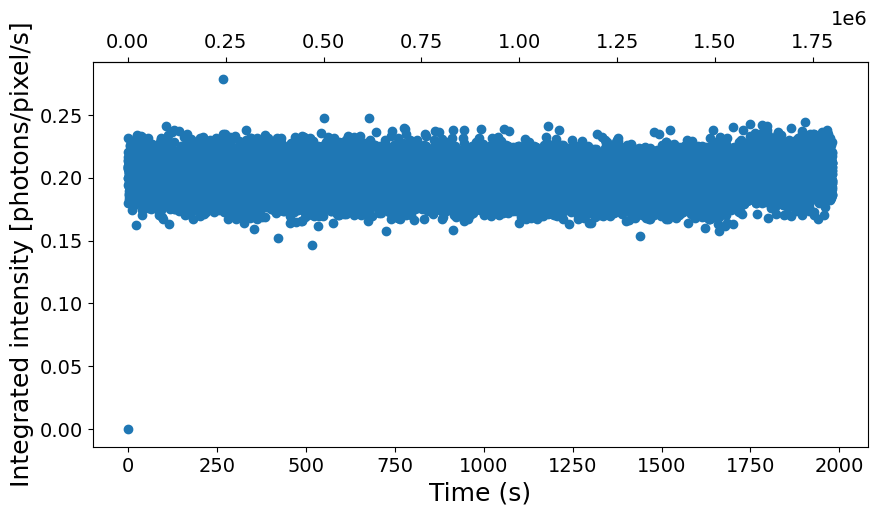

In [22]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [23]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [24]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**19
sparse_depth = 11
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 3.82 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 2.19e-04
	 | memory usage (sparse.csr_array @ float32) = 5.499 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [01:04<00:00, 11.90it/s]


Done! (elapsed time = 64.6 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:03<00:00,  2.01it/s]

Done! (elapsed time = 5.14 s)


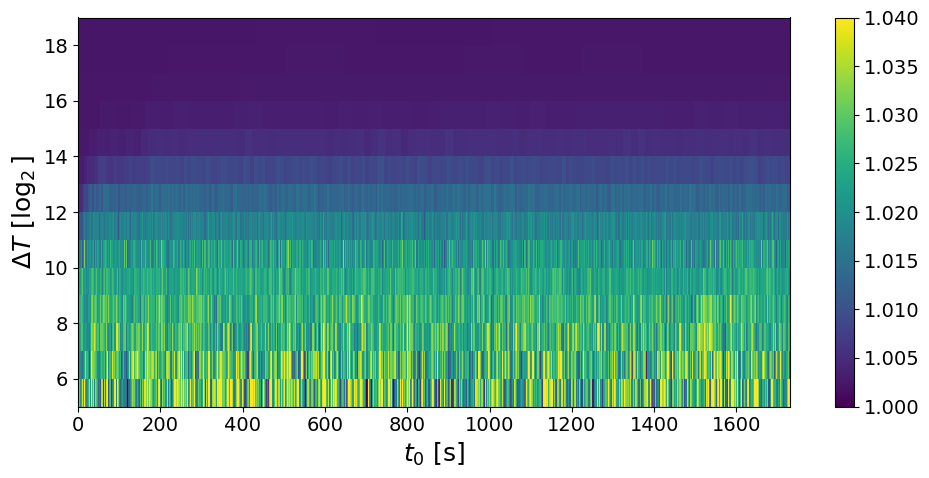

In [25]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [26]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

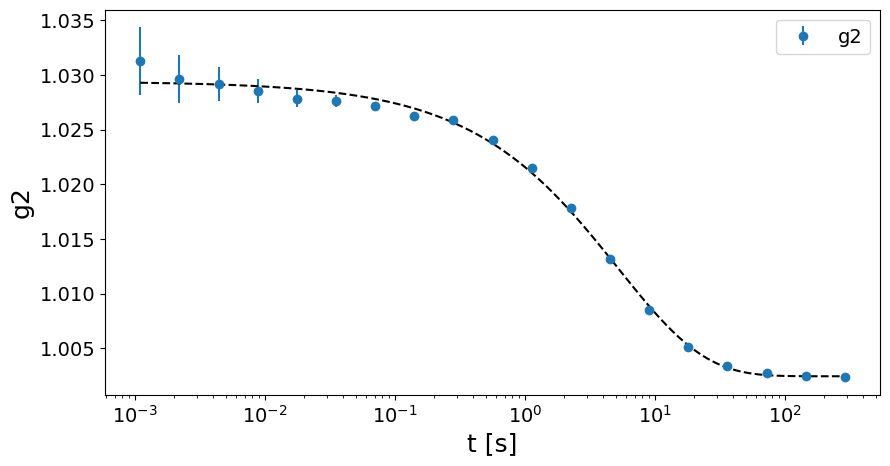

####### Fit parameters #######
tau = 5.1774 +/- 0.395 s
beta = 0.6511 +/- 0.0392
c = 0.027 +/- 0.0005
y0 = 1.0024 +/- 0.0004


In [27]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 310C Q =  0.19 Å, 30 min @ 1ms (1_800_000fm)) (GeO2_7, dataset 1, scan 3)

In [29]:
#######################################
sample_name = 'GeO2_7_310C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00042.h5 (43/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00018.h5 (19/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/361 

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3044074 pixels (of 4471016 => 68.08 %)
################################################################################



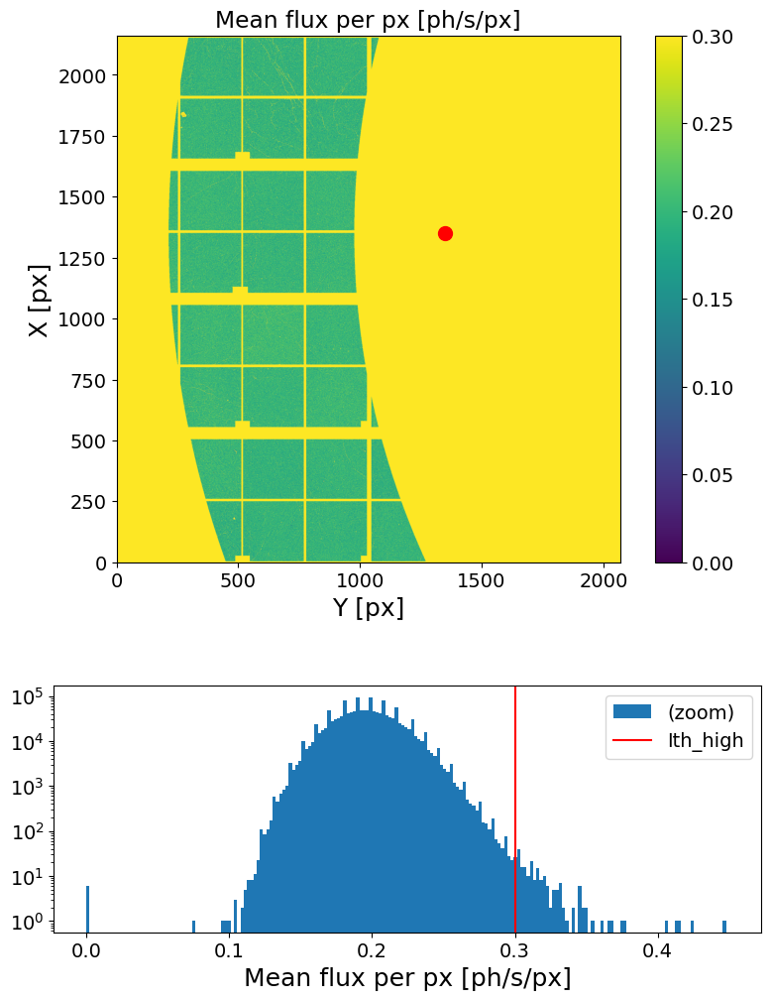

In [30]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [31]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

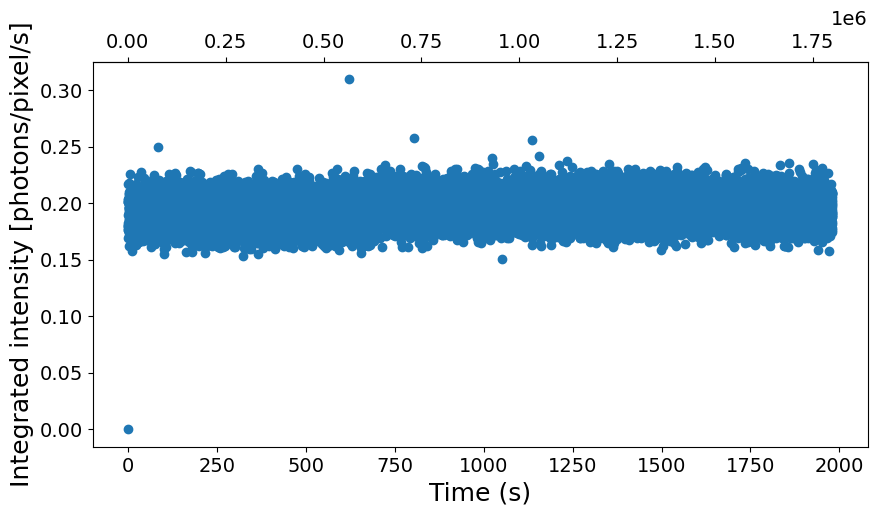

In [32]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [33]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [34]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**19
sparse_depth = 11
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 5.08 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 2.14e-04
	 | memory usage (sparse.csr_array @ float32) = 5.378 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [00:51<00:00, 14.80it/s]


Done! (elapsed time = 51.99 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

Done! (elapsed time = 5.71 s)


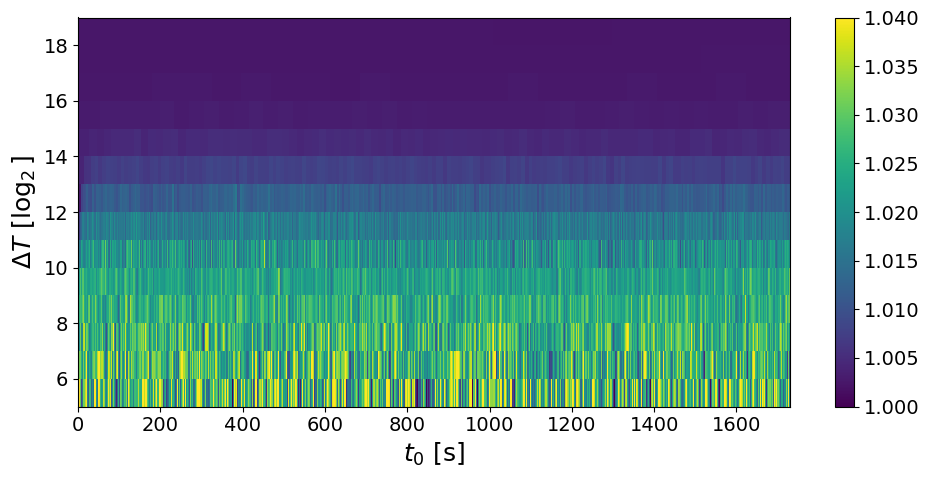

In [35]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [36]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

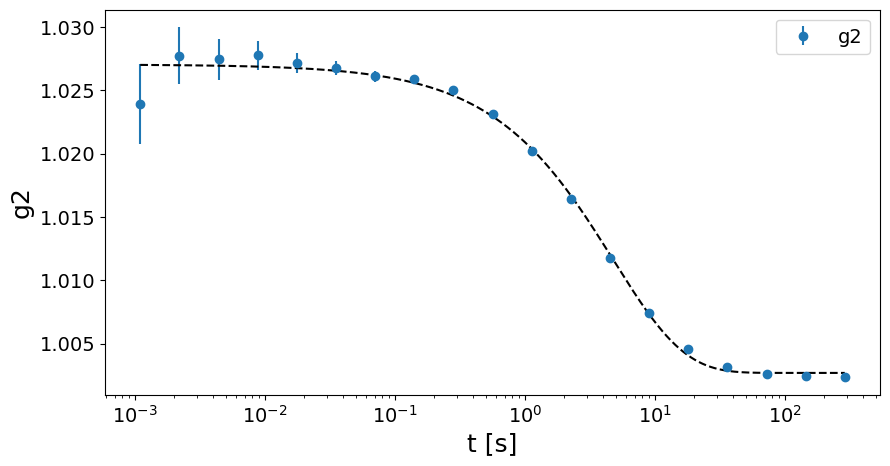

####### Fit parameters #######
tau = 4.7584 +/- 0.4451 s
beta = 0.7928 +/- 0.07
c = 0.0243 +/- 0.0006
y0 = 1.0027 +/- 0.0005


In [37]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 345C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [8]:
#######################################
sample_name = 'GeO2_7_345C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 l

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3044005 pixels (of 4471016 => 68.08 %)
################################################################################



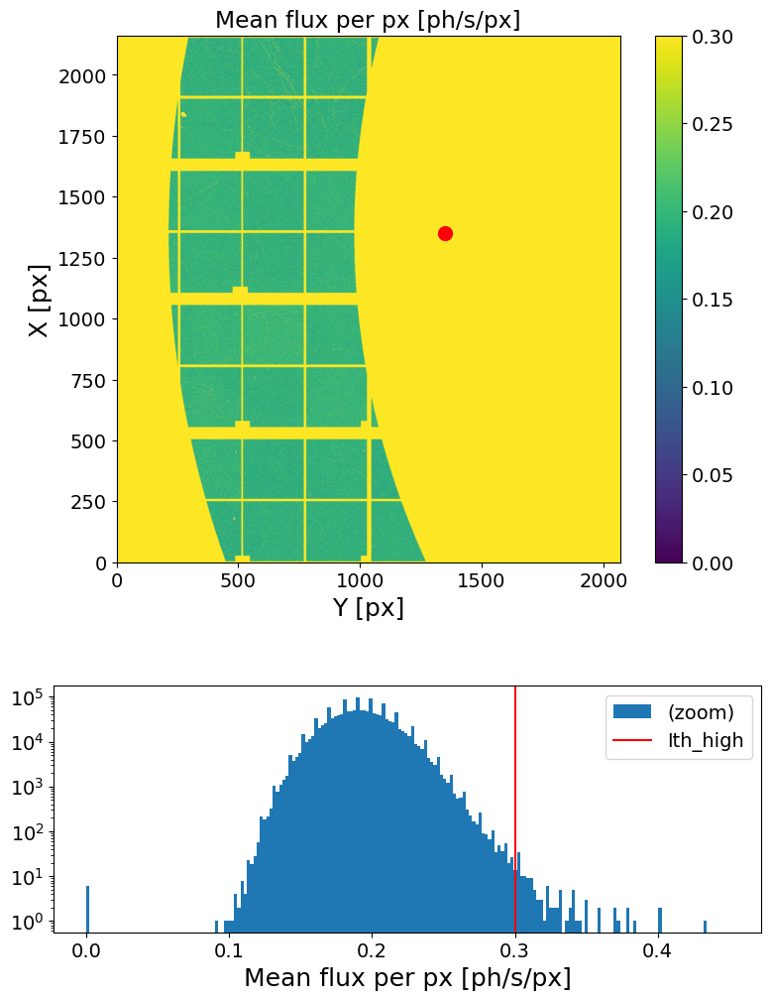

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

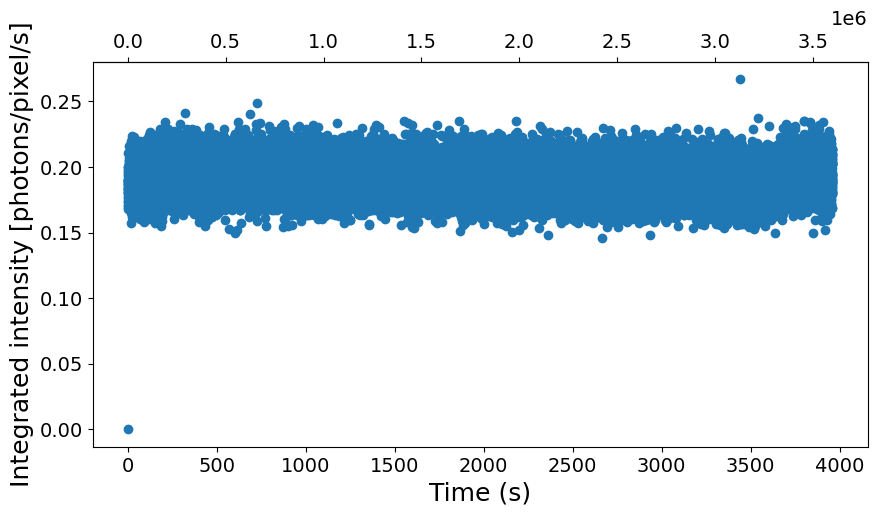

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [12]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 21             41.7        1502512
1    3*2**20                 20             13.0         453936
2   13*2**18                 18              5.0         191792
3   27*2**17                 17              2.0          60720
4  109*2**15                 15              1.0          27952
5  219*2**14                 14              0.0          11568
6  439*2**13                 13              0.0           3376
----------------------------------------------------


In [13]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**20
sparse_depth = 12
dense_depth = 20
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 10.22 s)
	 | 3145728 frames X 1427140 pixels
	 | sparsity = 2.11e-04
	 | memory usage (sparse.csr_array @ float32) = 10.585 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [03:24<00:00,  3.75it/s]


Done! (elapsed time = 206.8 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

Done! (elapsed time = 6.65 s)


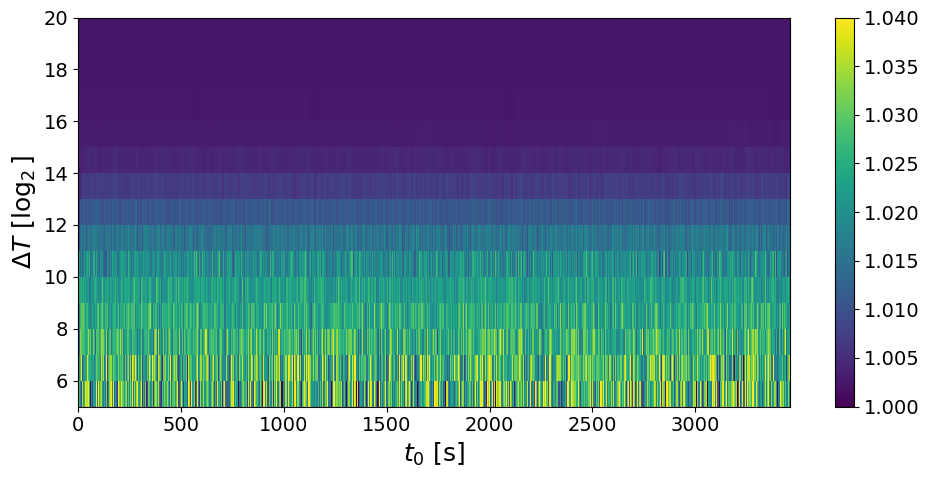

In [14]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [15]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

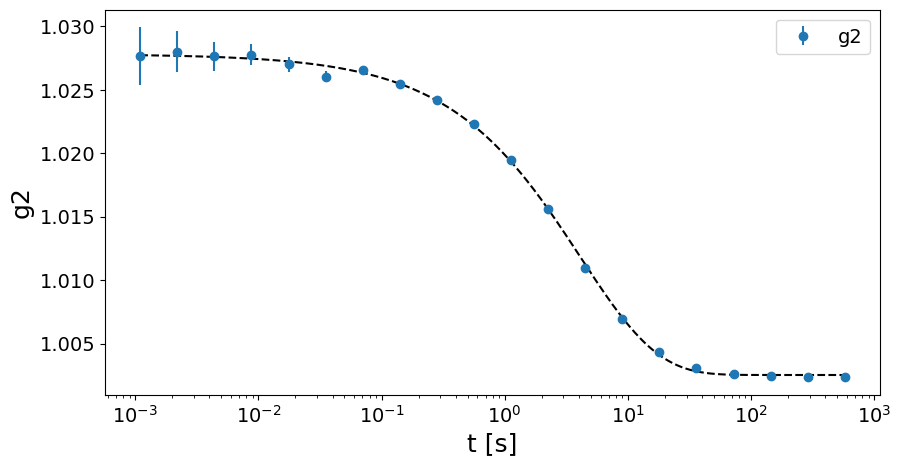

####### Fit parameters #######
tau = 4.1109 +/- 0.1278 s
beta = 0.6912 +/- 0.0187
c = 0.0253 +/- 0.0002
y0 = 1.0025 +/- 0.0001


In [16]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 380C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [17]:
#######################################
sample_name = 'GeO2_7_380C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/720 loop

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043946 pixels (of 4471016 => 68.08 %)
################################################################################



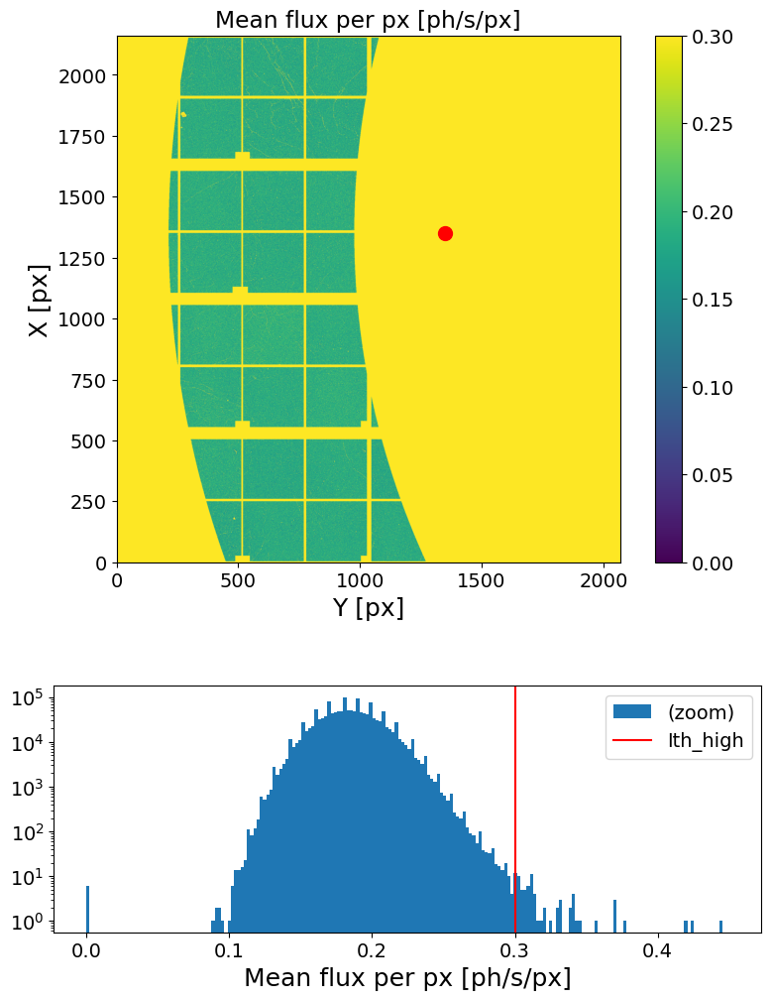

In [18]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [21]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

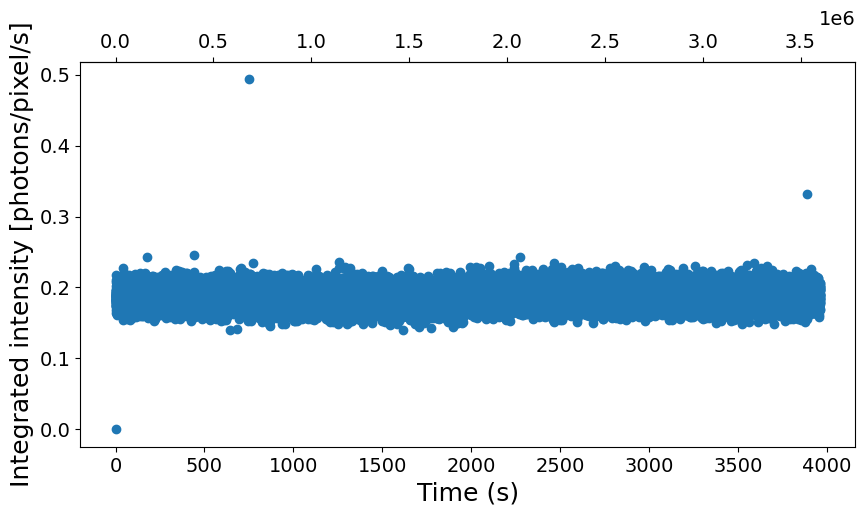

In [22]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [23]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 21             41.7        1502512
1    3*2**20                 20             13.0         453936
2   13*2**18                 18              5.0         191792
3   27*2**17                 17              2.0          60720
4  109*2**15                 15              1.0          27952
5  219*2**14                 14              0.0          11568
6  439*2**13                 13              0.0           3376
----------------------------------------------------


In [24]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**20
sparse_depth = 12
dense_depth = 20
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 11.18 s)
	 | 3145728 frames X 1427140 pixels
	 | sparsity = 2.06e-04
	 | memory usage (sparse.csr_array @ float32) = 10.341 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [02:55<00:00,  4.38it/s]


Done! (elapsed time = 176.88 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

Done! (elapsed time = 5.87 s)


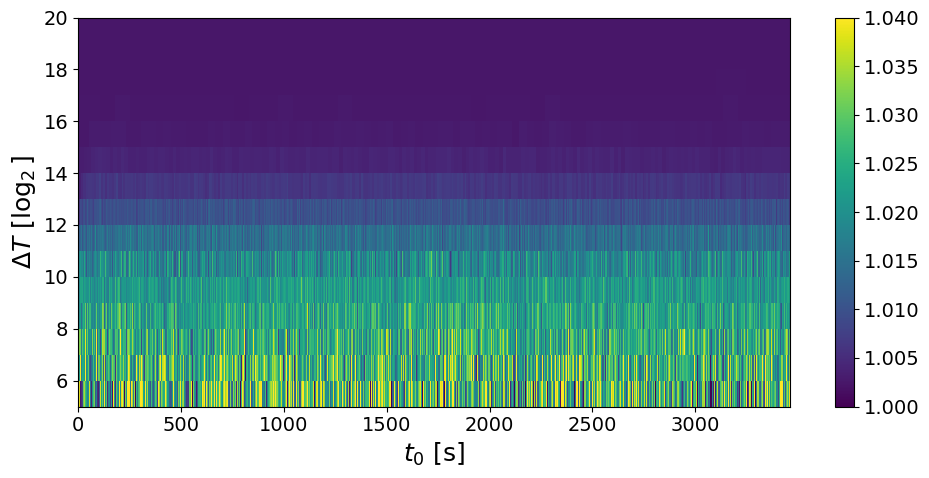

In [25]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [26]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

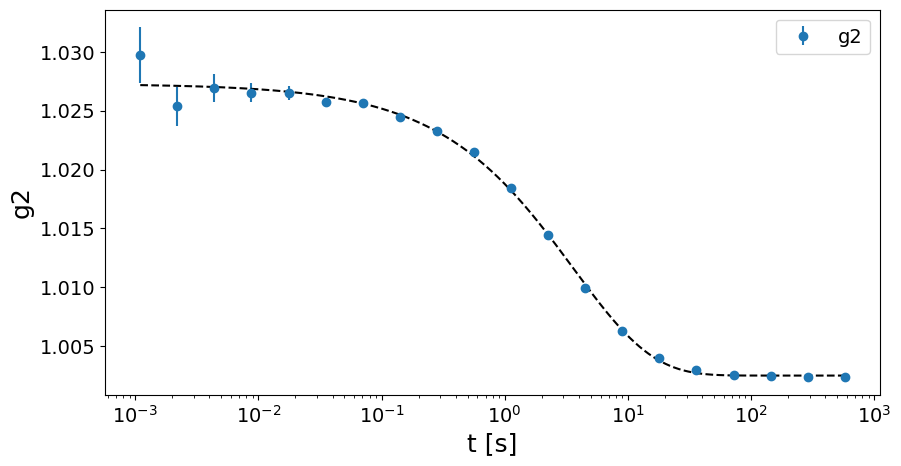

####### Fit parameters #######
tau = 3.603 +/- 0.3195 s
beta = 0.6766 +/- 0.0517
c = 0.0248 +/- 0.0006
y0 = 1.0025 +/- 0.0004


In [27]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 415C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [8]:
#######################################
sample_name = 'GeO2_7_415C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/720 lo

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043942 pixels (of 4471016 => 68.08 %)
################################################################################



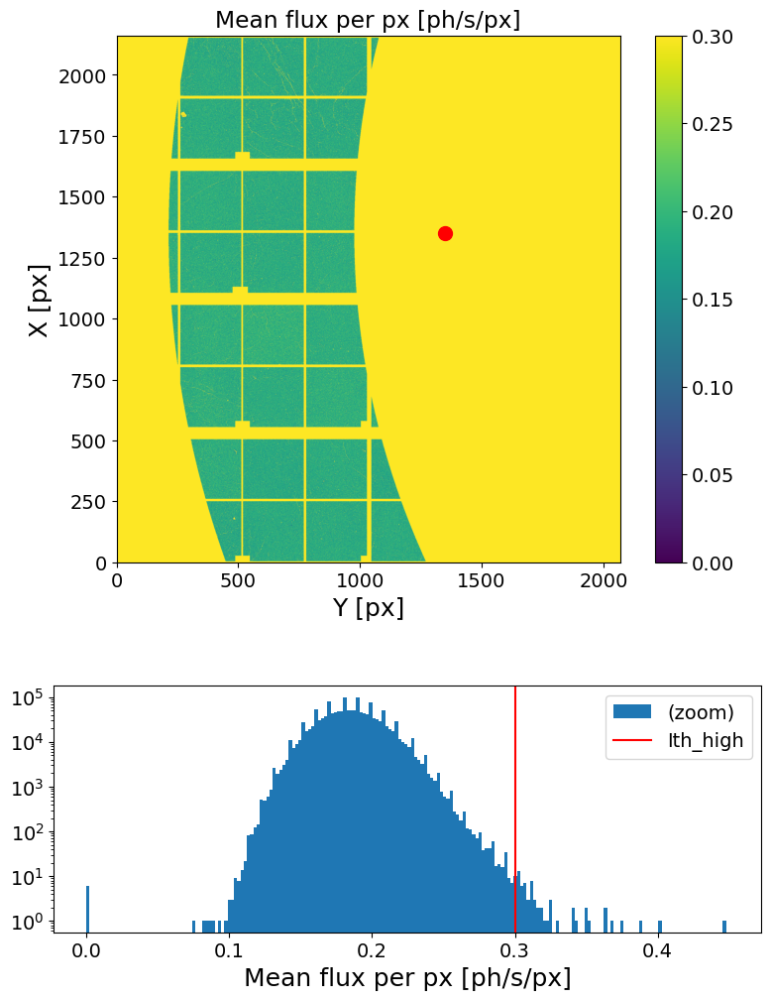

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

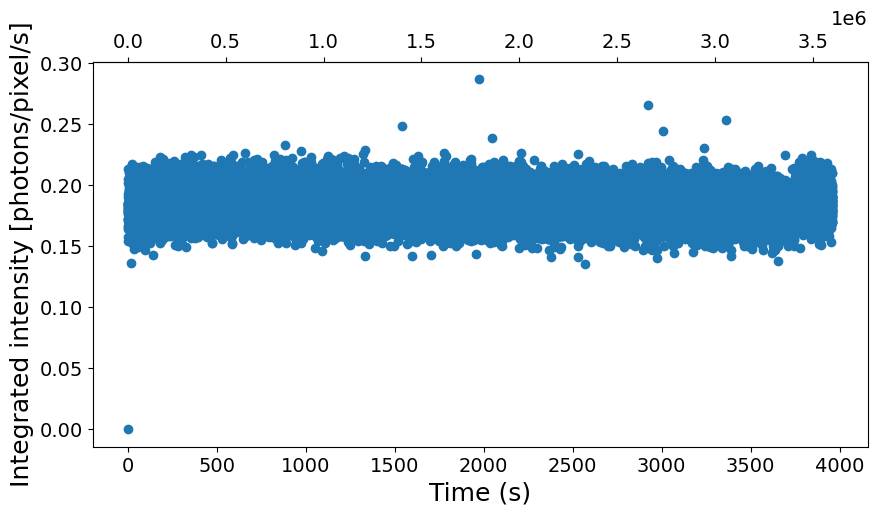

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [12]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 21             41.7        1502512
1    3*2**20                 20             13.0         453936
2   13*2**18                 18              5.0         191792
3   27*2**17                 17              2.0          60720
4  109*2**15                 15              1.0          27952
5  219*2**14                 14              0.0          11568
6  439*2**13                 13              0.0           3376
----------------------------------------------------


In [19]:
import importlib
importlib.reload(XPCS)
gc.collect()

2411

In [20]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**20
sparse_depth = 12
dense_depth = 20
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...


Done! (elapsed time = 10.82 s)
	 | 3145728 frames X 1427140 pixels
	 | sparsity = 2.02e-04
	 | memory usage (sparse.csr_array @ float32) = 10.182 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [03:36<00:00,  3.55it/s]


Done! (elapsed time = 216.41 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:05<00:00,  1.59it/s]

Done! (elapsed time = 7.37 s)


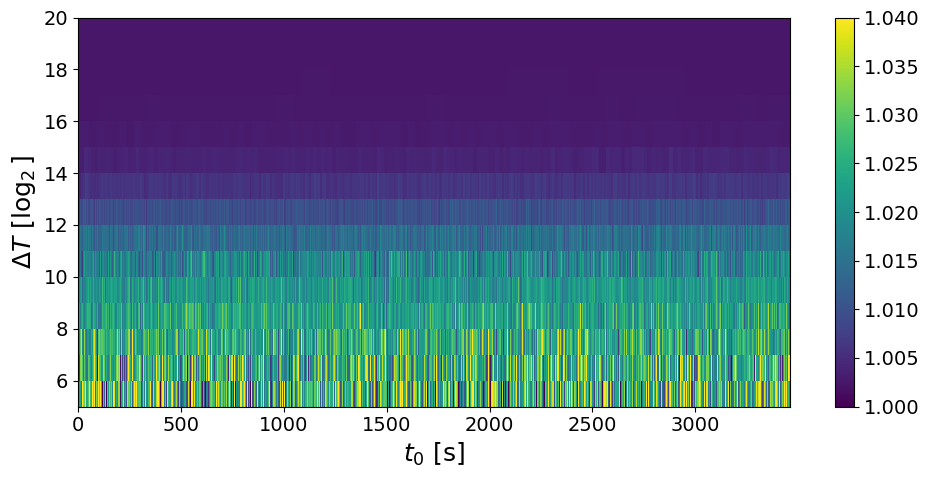

In [21]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [22]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

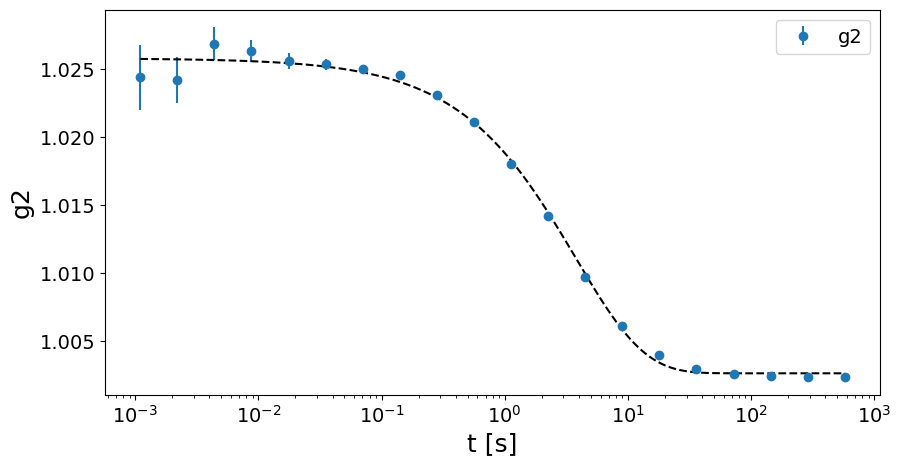

####### Fit parameters #######
tau = 3.753 +/- 0.2683 s
beta = 0.7782 +/- 0.0537
c = 0.0231 +/- 0.0004
y0 = 1.0027 +/- 0.0003


In [23]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 450C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [8]:
#######################################
sample_name = 'GeO2_7_450C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/720 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00035.h5eiger4m_v2_sparse_frame_0_00038.h5  (36/720 loops)(39/720 loops)

	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/720 l

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043914 pixels (of 4471016 => 68.08 %)
################################################################################



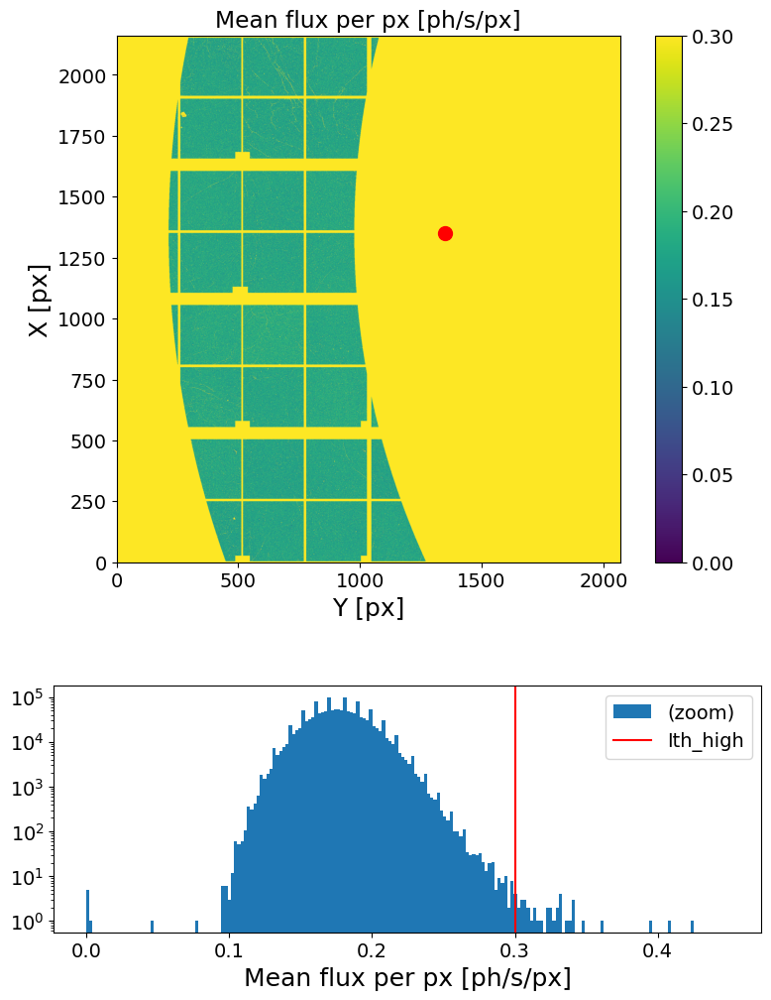

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

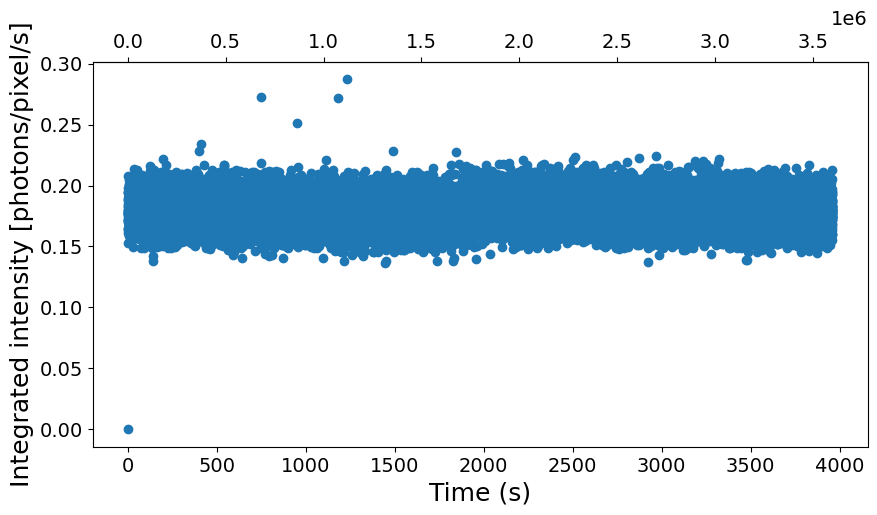

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [12]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 21             41.7        1502512
1    3*2**20                 20             13.0         453936
2   13*2**18                 18              5.0         191792
3   27*2**17                 17              2.0          60720
4  109*2**15                 15              1.0          27952
5  219*2**14                 14              0.0          11568
6  439*2**13                 13              0.0           3376
----------------------------------------------------


In [16]:
#reload environment
import importlib
importlib.reload(XPCS)


<module 'XPCS_tools' from '/mnt/data/DataLSF/2025/ESRF/ID10/HC6209/SCRIPTS/XPCS_library/XPCS_tools.py'>

In [17]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**20
sparse_depth = 12
dense_depth = 20
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 10.78 s)
	 | 3145728 frames X 1427140 pixels
	 | sparsity = 1.97e-04
	 | memory usage (sparse.csr_array @ float32) = 9.92 GB
Computing sparse multitau G2t...


100%|██████████| 768/768 [01:31<00:00,  8.39it/s]


Done! (elapsed time = 91.57 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:02<00:00,  3.72it/s]

Done! (elapsed time = 4.25 s)


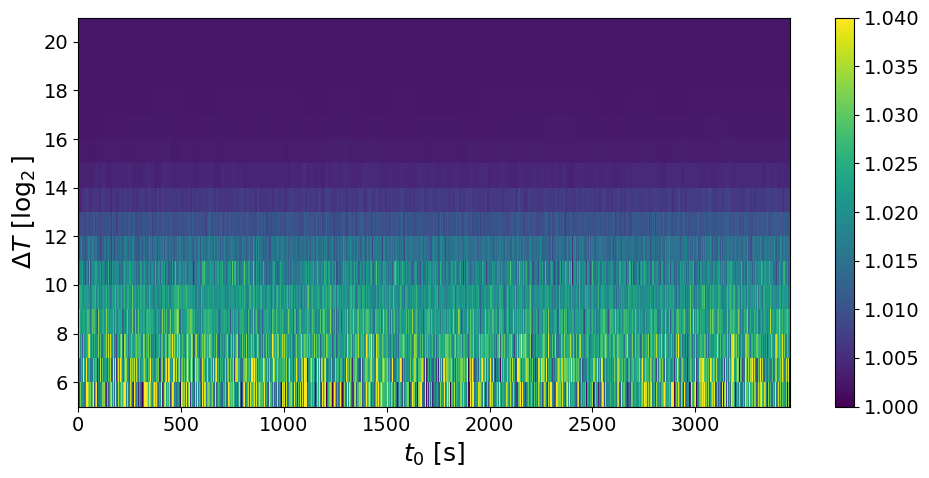

In [18]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [19]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

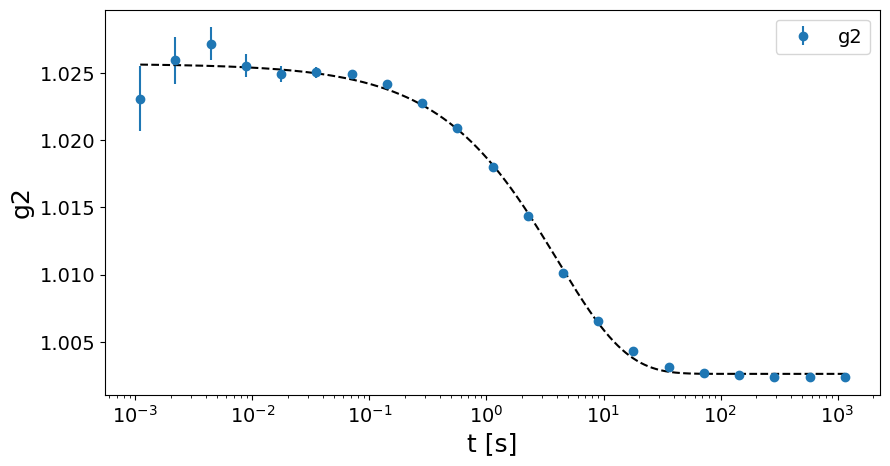

####### Fit parameters #######
tau = 4.0219 +/- 0.3432 s
beta = 0.733 +/- 0.0581
c = 0.023 +/- 0.0005
y0 = 1.0026 +/- 0.0003


In [20]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 485C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 3) fresh point

In [8]:
#######################################
sample_name = 'GeO2_7_485C'
Ndataset = 1
Nscan = 3
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...


	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
 eiger4m_v2_sparse_frame_0_00008.h5 (9/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/720 loops)
 eiger4m_v2_sparse_frame_0_00007.h5 (8/

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043915 pixels (of 4471016 => 68.08 %)
################################################################################



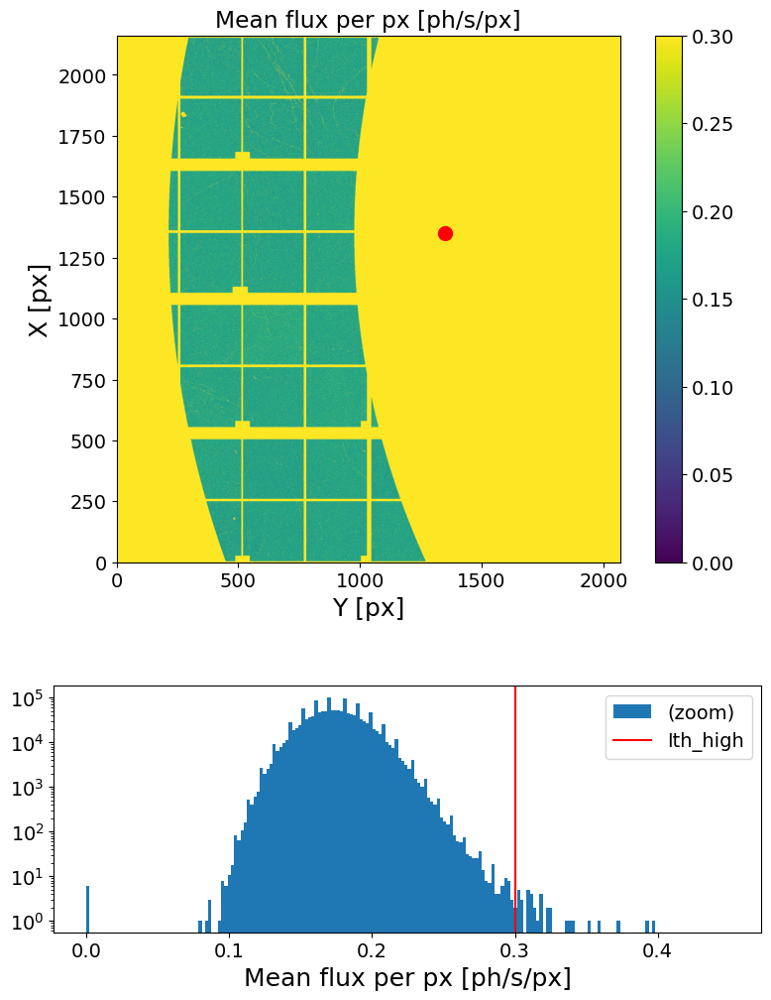

In [9]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [10]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

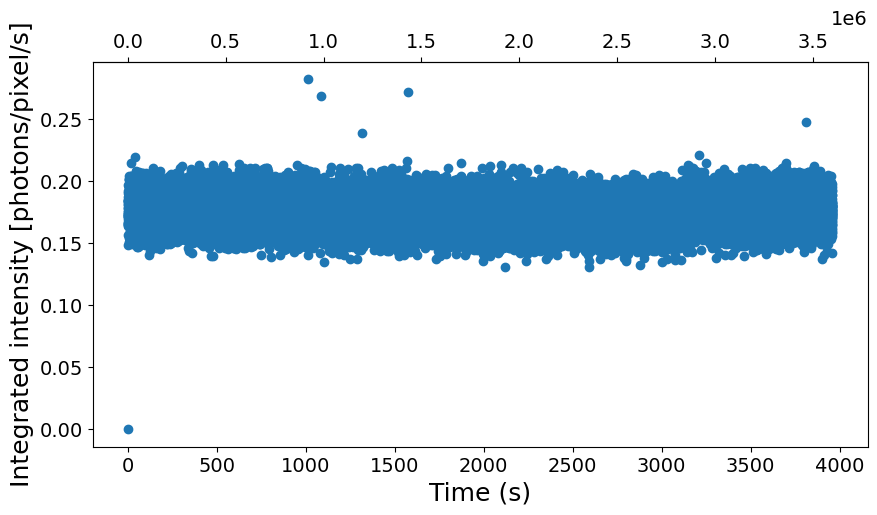

In [11]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [12]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 21             41.7        1502512
1    3*2**20                 20             13.0         453936
2   13*2**18                 18              5.0         191792
3   27*2**17                 17              2.0          60720
4  109*2**15                 15              1.0          27952
5  219*2**14                 14              0.0          11568
6  439*2**13                 13              0.0           3376
----------------------------------------------------


In [13]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**20
sparse_depth = 15
dense_depth = 20
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 10.43 s)
	 | 3145728 frames X 1427140 pixels
	 | sparsity = 1.92e-04
	 | memory usage (sparse.csr_array @ float32) = 9.656 GB
Computing sparse multitau G2t...


100%|██████████| 96/96 [04:08<00:00,  2.59s/it]


Done! (elapsed time = 249.04 s)
Computing dense multitau G2t...


100%|██████████| 5/5 [00:00<00:00, 20.79it/s]

Done! (elapsed time = 2.46 s)


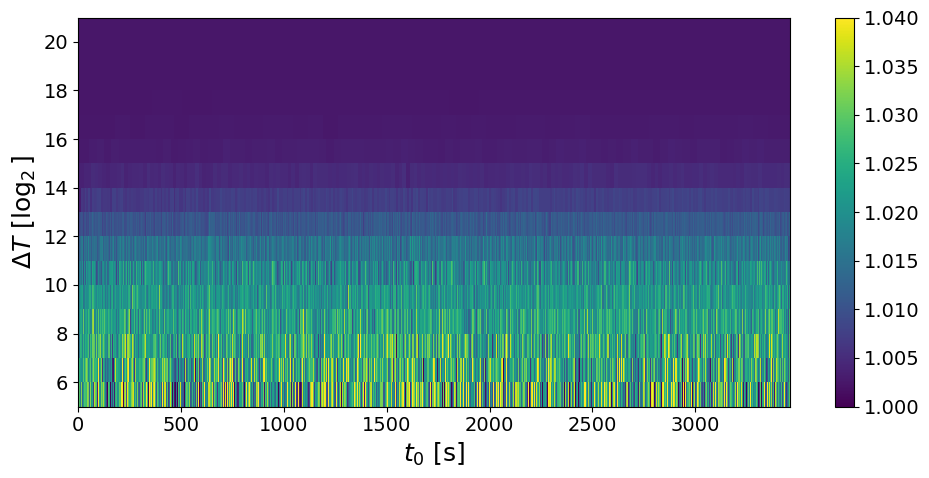

In [14]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [15]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


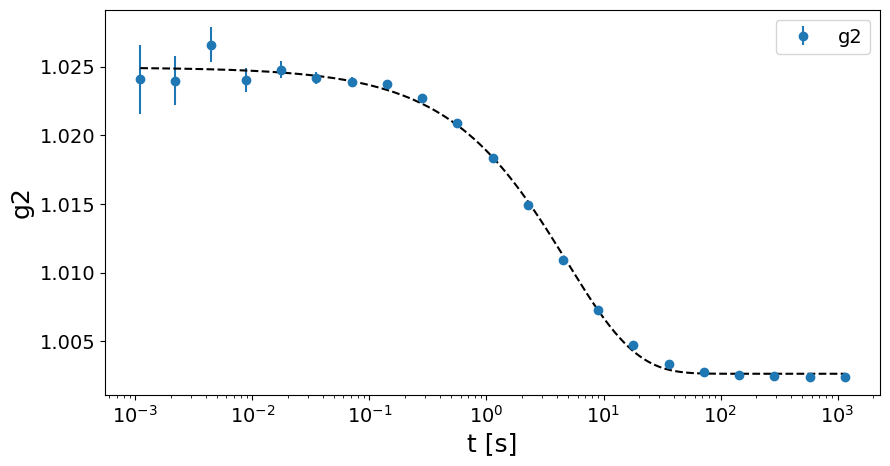

####### Fit parameters #######
tau = 4.8264 +/- 0.3323 s
beta = 0.7287 +/- 0.0459
c = 0.0223 +/- 0.0004
y0 = 1.0026 +/- 0.0003


In [16]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 520C_2 Q =  0.19 Å, 60 min @ 1ms (7_200_000fm)) (GeO2_7, dataset 1, scan 5) fresh point

In [17]:
#######################################
sample_name = 'GeO2_7_520C'
Ndataset = 1
Nscan = 5
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 7200240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00038.h

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043923 pixels (of 4471016 => 68.08 %)
################################################################################



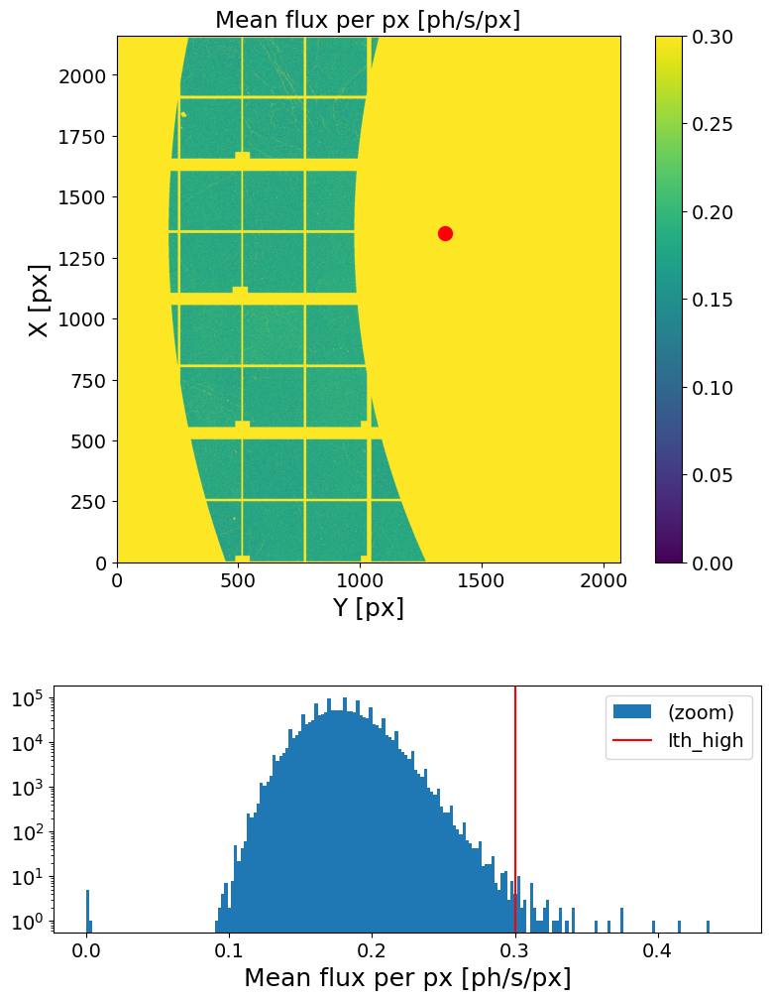

In [18]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [19]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

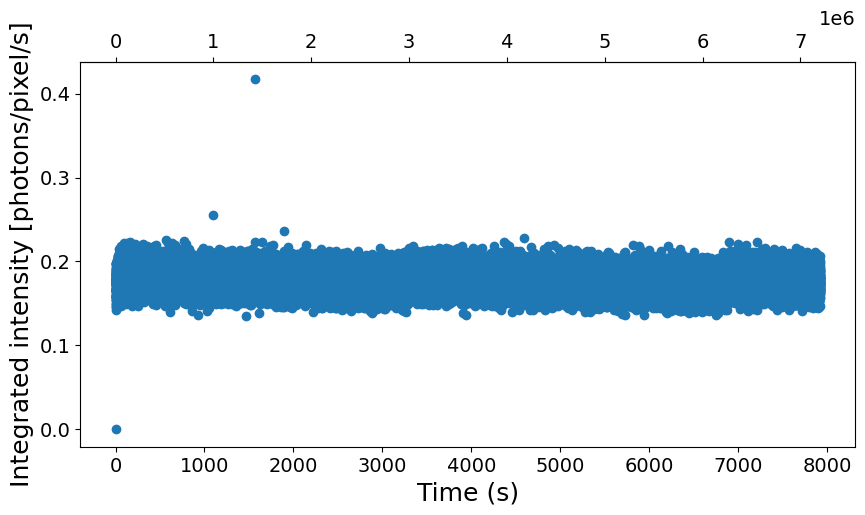

In [20]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [21]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 7200240    =>    log2(Nf) = 22.78
----------------------------------------------------
   reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0       2**22                 22             41.7        3005936
1     3*2**21                 21             13.0         908784
2    13*2**19                 19              5.0         384496
3    27*2**18                 18              2.0         122352
4   109*2**16                 16              1.0          56816
5   219*2**15                 15              0.0          24048
6   439*2**14                 14              0.0           7664
7  1757*2**12                 12              0.0           3568
----------------------------------------------------


In [22]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**21
sparse_depth = 12
dense_depth = 21
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...


Done! (elapsed time = 19.82 s)
	 | 6291456 frames X 1427140 pixels
	 | sparsity = 1.95e-04
	 | memory usage (sparse.csr_array @ float32) = 19.656 GB
Computing sparse multitau G2t...


100%|██████████| 1536/1536 [03:23<00:00,  7.56it/s]


Done! (elapsed time = 203.28 s)
Computing dense multitau G2t...


100%|██████████| 9/9 [00:04<00:00,  1.98it/s]

Done! (elapsed time = 9.25 s)


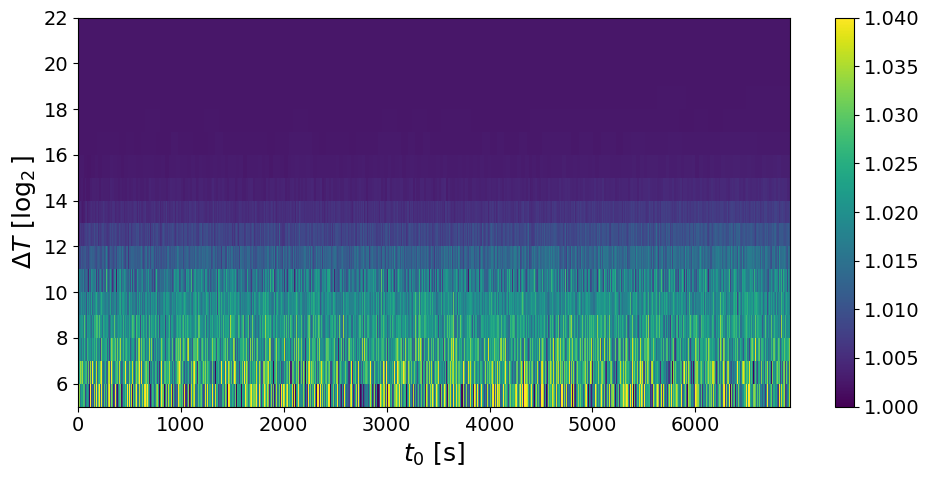

In [23]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [24]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


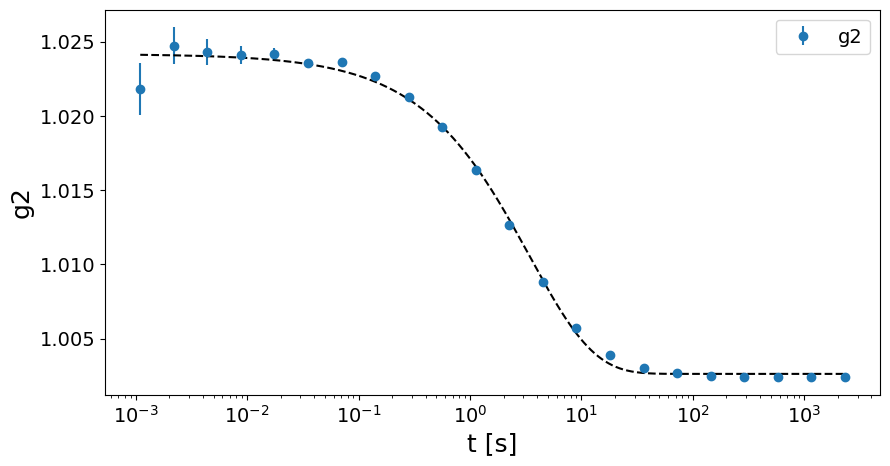

####### Fit parameters #######
tau = 3.4279 +/- 0.2477 s
beta = 0.7522 +/- 0.0526
c = 0.0215 +/- 0.0004
y0 = 1.0026 +/- 0.0002


In [25]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 555C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan4) fresh point

In [27]:
#######################################
sample_name = 'GeO2_7_555C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 7200240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/1441 loops)	 -> loading file
 eiger4m_v2_sparse_frame_0_00029.h5 (30/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00043.h5 (44/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043889 pixels (of 4471016 => 68.08 %)
################################################################################



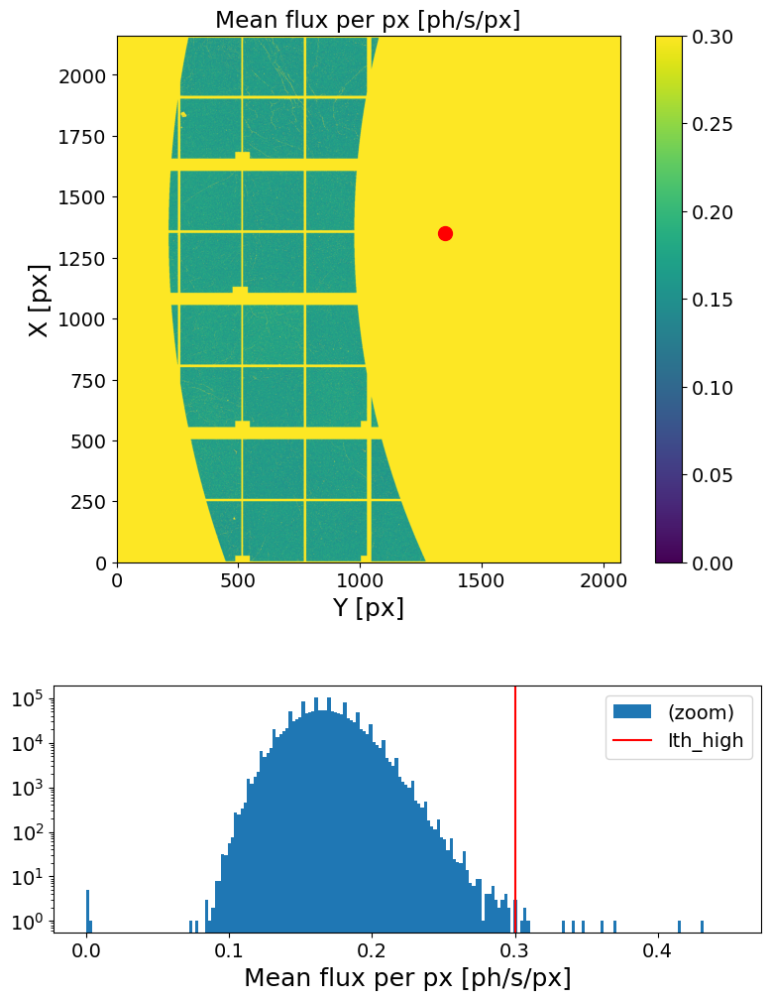

In [28]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [29]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

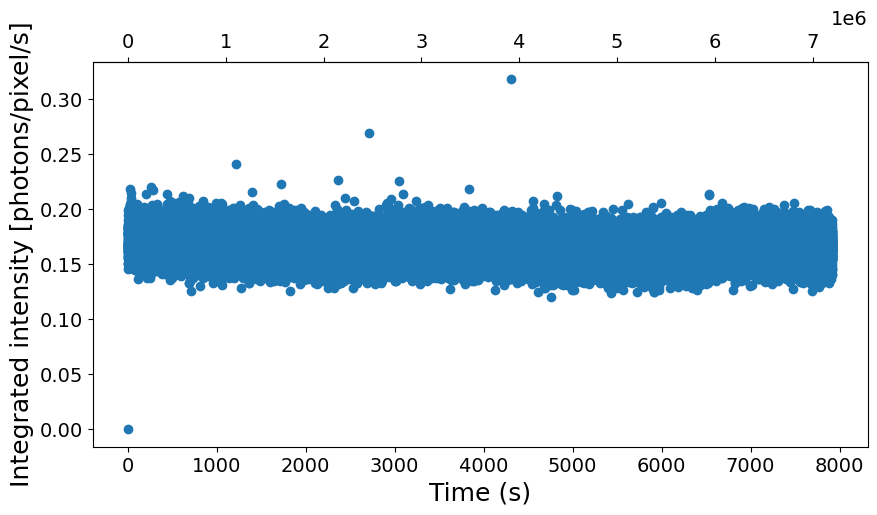

In [30]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [31]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 7200240    =>    log2(Nf) = 22.78
----------------------------------------------------
   reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0       2**22                 22             41.7        3005936
1     3*2**21                 21             13.0         908784
2    13*2**19                 19              5.0         384496
3    27*2**18                 18              2.0         122352
4   109*2**16                 16              1.0          56816
5   219*2**15                 15              0.0          24048
6   439*2**14                 14              0.0           7664
7  1757*2**12                 12              0.0           3568
----------------------------------------------------


In [32]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**21
sparse_depth = 12
dense_depth = 21
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...


Done! (elapsed time = 18.84 s)
	 | 6291456 frames X 1427140 pixels
	 | sparsity = 1.83e-04
	 | memory usage (sparse.csr_array @ float32) = 18.361 GB
Computing sparse multitau G2t...


100%|██████████| 1536/1536 [03:18<00:00,  7.76it/s]


Done! (elapsed time = 198.03 s)
Computing dense multitau G2t...


100%|██████████| 9/9 [00:04<00:00,  1.90it/s]

Done! (elapsed time = 9.16 s)


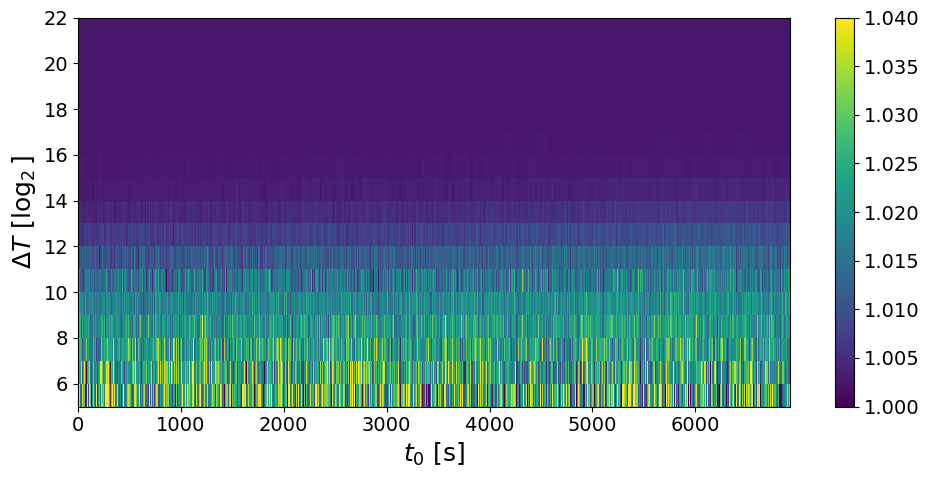

In [33]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [34]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


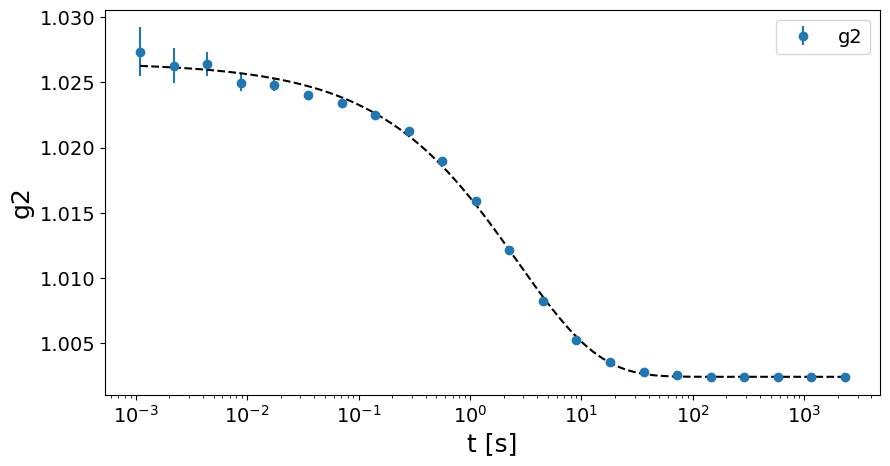

####### Fit parameters #######
tau = 2.659 +/- 0.1408 s
beta = 0.592 +/- 0.0256
c = 0.0241 +/- 0.0003
y0 = 1.0024 +/- 0.0002


In [35]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 590C Q =  0.19 Å, 120 min @ 1ms (7_200_000fm)) (GeO2_7, dataset 1, scan4) fresh point

In [36]:
#######################################
sample_name = 'GeO2_7_590C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 7200240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/1441 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043889 pixels (of 4471016 => 68.08 %)
################################################################################



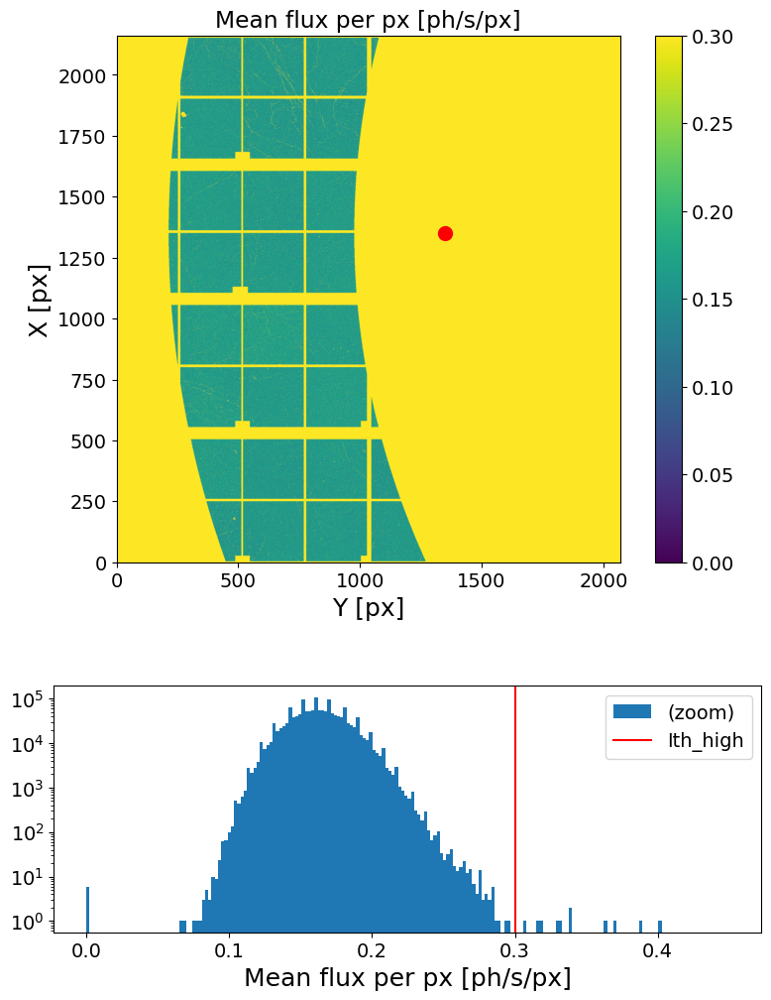

In [37]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [38]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

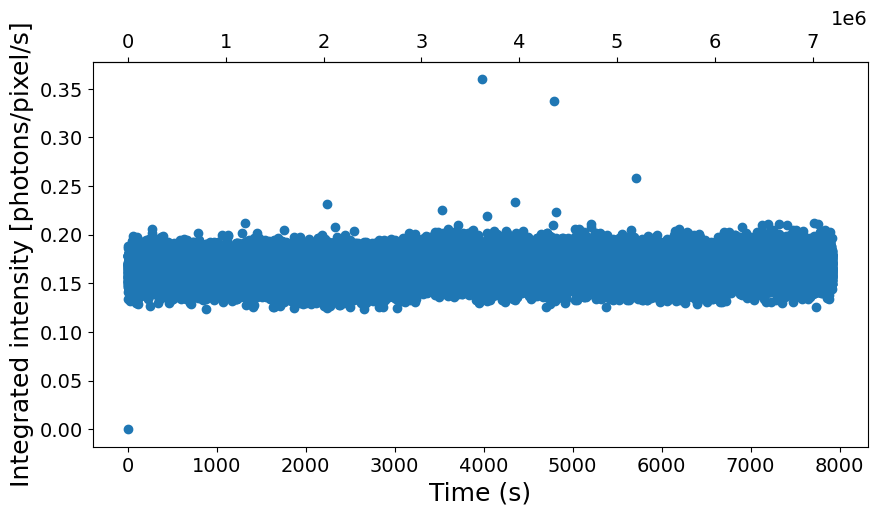

In [39]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [40]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 7200240    =>    log2(Nf) = 22.78
----------------------------------------------------
   reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0       2**22                 22             41.7        3005936
1     3*2**21                 21             13.0         908784
2    13*2**19                 19              5.0         384496
3    27*2**18                 18              2.0         122352
4   109*2**16                 16              1.0          56816
5   219*2**15                 15              0.0          24048
6   439*2**14                 14              0.0           7664
7  1757*2**12                 12              0.0           3568
----------------------------------------------------


In [41]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**21
sparse_depth = 12
dense_depth = 21
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...


Done! (elapsed time = 19.0 s)
	 | 6291456 frames X 1427140 pixels
	 | sparsity = 1.81e-04
	 | memory usage (sparse.csr_array @ float32) = 18.178 GB
Computing sparse multitau G2t...


100%|██████████| 1536/1536 [03:22<00:00,  7.58it/s]


Done! (elapsed time = 202.69 s)
Computing dense multitau G2t...


100%|██████████| 9/9 [00:05<00:00,  1.78it/s]

Done! (elapsed time = 9.39 s)


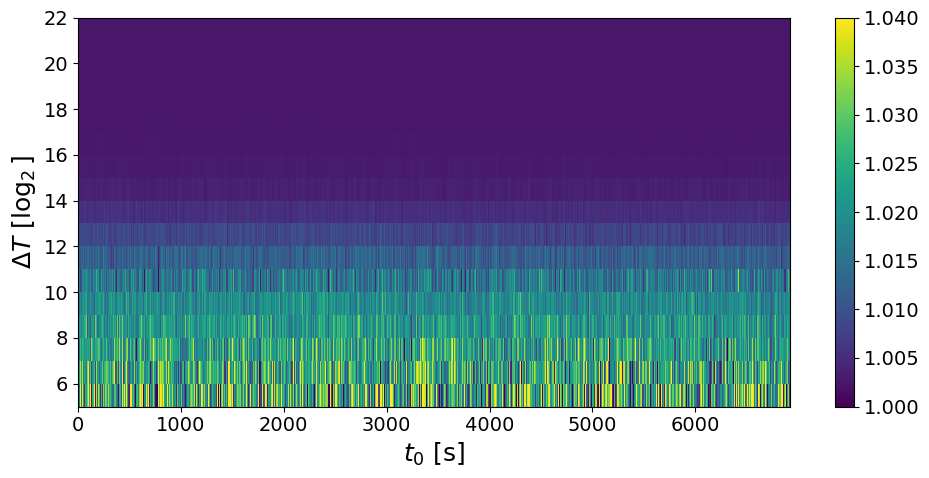

In [42]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [43]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


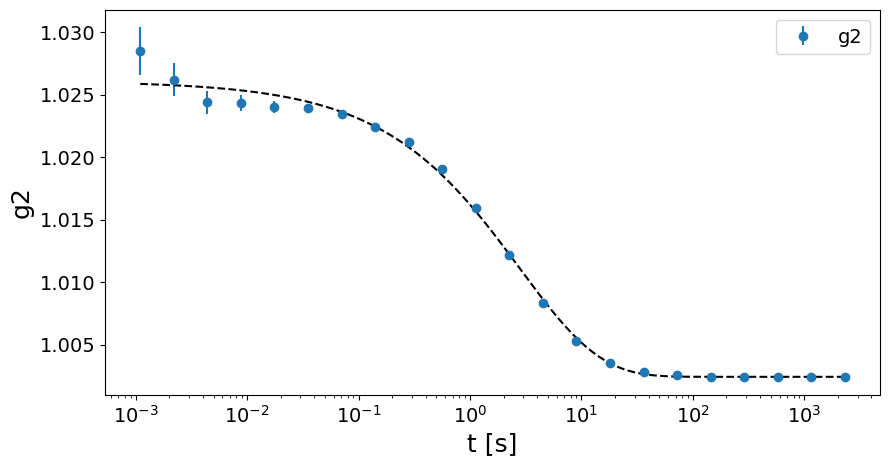

####### Fit parameters #######
tau = 2.7827 +/- 0.2679 s
beta = 0.6016 +/- 0.0477
c = 0.0236 +/- 0.0006
y0 = 1.0024 +/- 0.0003


In [44]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 625C Q =  0.19 Å, 180 min @ 1ms (10_800_000fm)) (GeO2_7, dataset 1, scan4)

In [10]:
#######################################
sample_name = 'GeO2_7_625C'
Ndataset = 1
Nscan = 4
Nfi, Nff = 0, int(1e5)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 10799904
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/21 loops)
	 -

### Flux check

################################################################################
Maximum count in the hull run -> 4.0
# of pixels above Ith_high treshold ->  3045556 pixels (of 4471016 => 68.12 %)
################################################################################



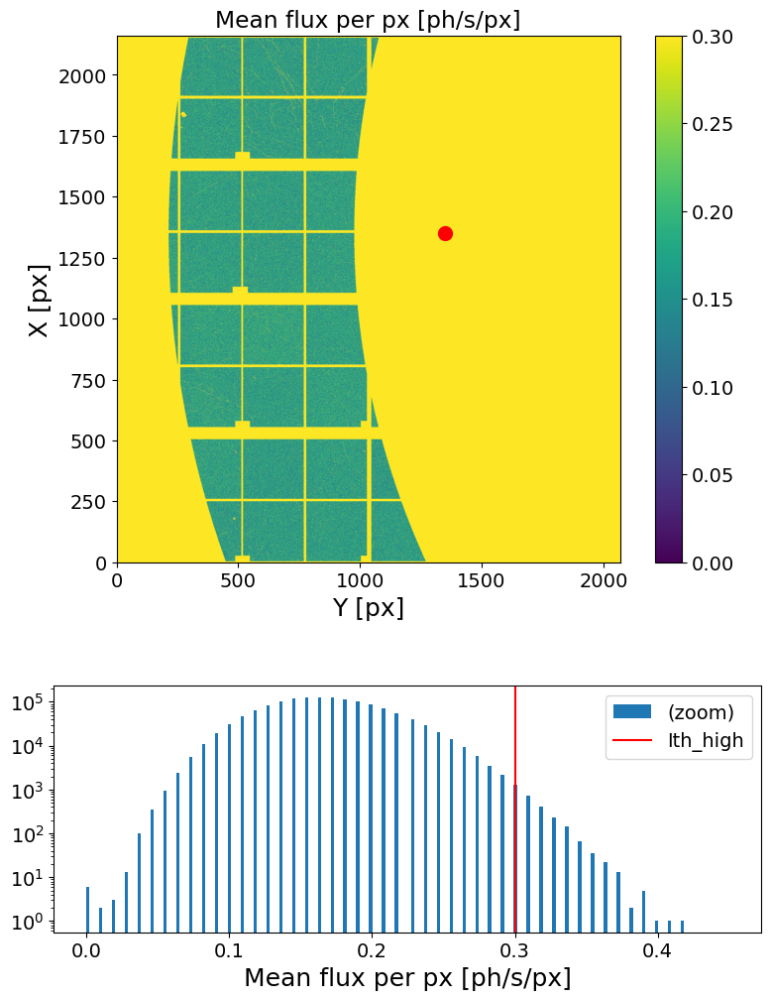

In [11]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [12]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

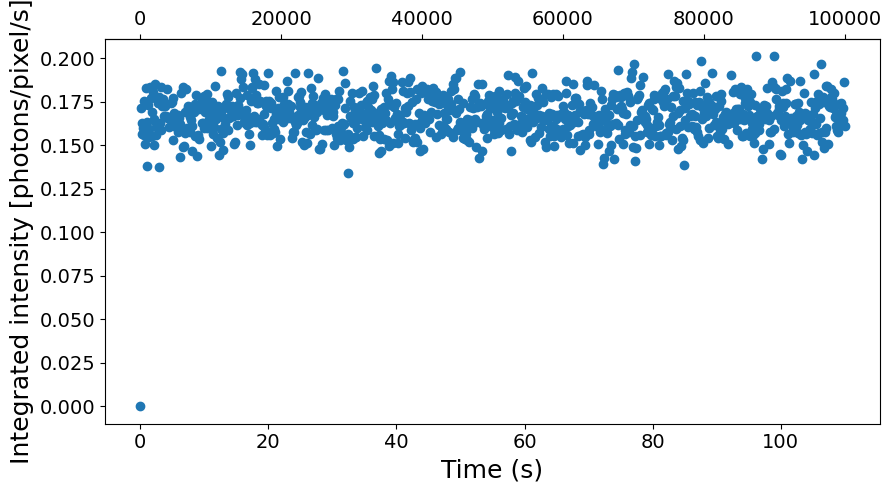

In [13]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [16]:
XPCS.print_Nf_choices(len(scan['fast_timer_period']))

       Nf = 10799904    =>    log2(Nf) = 23.36
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**23                 22             22.3        2411296
1    5*2**21                 20              3.0         314144
2   41*2**18                 17              0.0          52000
3  329*2**15                 14              0.0          19232
4  659*2**14                 13              0.0           2848
----------------------------------------------------


In [17]:
##### INPUTS #####
Nfi = 100
Nff = 100 + 2**23
sparse_depth = 13
dense_depth = 22
mask = load_mask
##################

G2tmt = XPCS.get_G2tmt_4sparse_bypartialloading(raw_folder, sample_name, Ndataset, Nscan, sparse_depth, dense_depth, Nfi, Nff, mask=mask)

Computing sparse multitau G2t...


100%|██████████| 1024/1024 [12:17<00:00,  1.39it/s]


Done! (elapsed time = 738.42 s)
Computing dense multitau G2t...


100%|██████████| 9/9 [00:03<00:00,  2.53it/s]

Done! (elapsed time = 3.56 s)


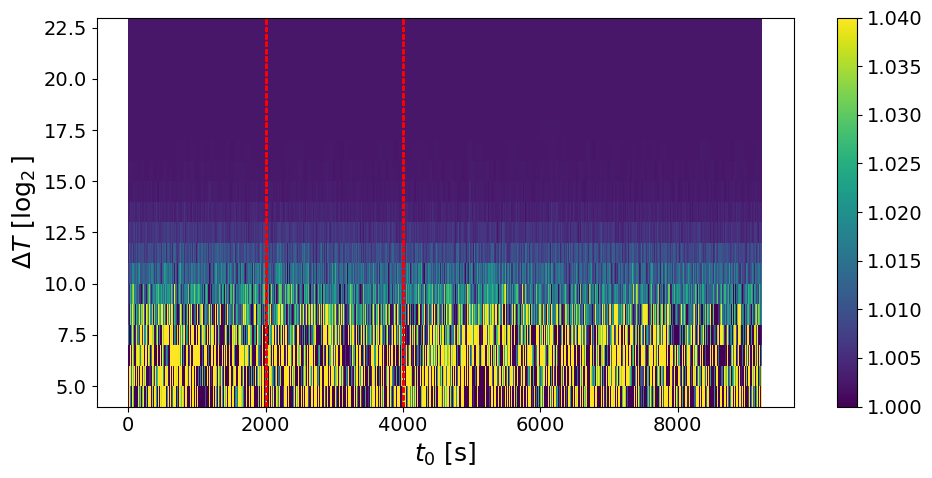

In [ ]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 4
filter_layer = 6
############################

XPCS.plot_G2tmt(G2tmt,  itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [ ]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

### Example of dose analysis

In [ ]:


cut1 = XPCS.cut_G2tmt(itime, G2tmt, 0, 200)
cut2 = XPCS.cut_G2tmt(itime, G2tmt, 2000, 4000)
cut3 = XPCS.cut_G2tmt(itime, G2tmt, 4000, 6000)
cut4 = XPCS.cut_G2tmt(itime, G2tmt, 6000, 8000)
cut5 = XPCS.cut_G2tmt(itime, G2tmt, 8000, 10000)

t_mt1, g2_mt1, dg2_mt1 = XPCS.get_g2mt(itime, cut1)
t_mt2, g2_mt2, dg2_mt2 = XPCS.get_g2mt(itime, cut2)
t_mt3, g2_mt3, dg2_mt3 = XPCS.get_g2mt(itime, cut3)
t_mt4, g2_mt4, dg2_mt4 = XPCS.get_g2mt(itime, cut4)
t_mt5, g2_mt5, dg2_mt5 = XPCS.get_g2mt(itime, cut5)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


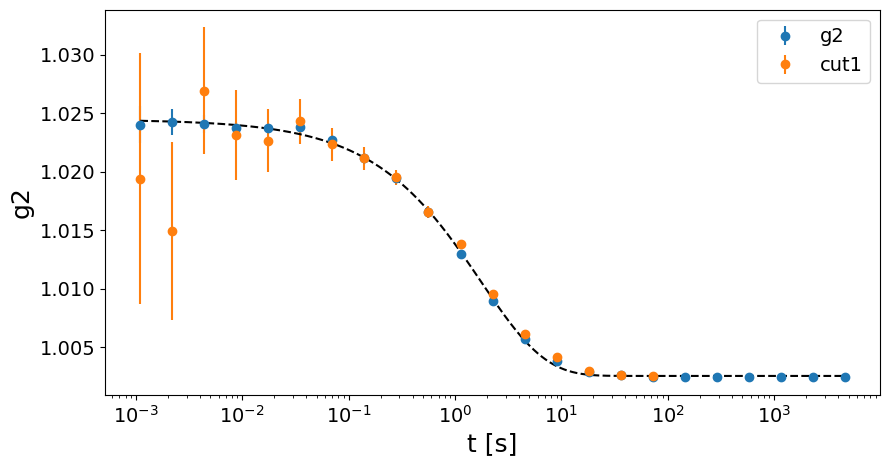

####### Fit parameters #######
tau = 1.7568 +/- 0.0467 s
beta = 0.723 +/- 0.0188
c = 0.0219 +/- 0.0002
y0 = 1.0025 +/- 0.0001


In [ ]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')
#plt.errorbar(t_mt1, g2_mt1, yerr=dg2_mt1, fmt='o', label='cut1')
#plt.errorbar(t_mt2, g2_mt2, yerr=dg2_mt2, fmt='o', label='cut2')
#plt.errorbar(t_mt3, g2_mt3, yerr=dg2_mt3, fmt='o', label='cut3')
#plt.errorbar(t_mt4, g2_mt4, yerr=dg2_mt4, fmt='o', label='cut4')
#plt.errorbar(t_mt5, g2_mt5, yerr=dg2_mt5, fmt='o', label='cut5')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
#plt.ylim(1,1.03)
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 660C Q =  0.19 Å, 180 min @ 1ms (10_800_000fm)) (GeO2_7, dataset 1, scan4)

In [23]:
#######################################
sample_name = 'GeO2_7_660C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, int(1e5)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 10799904
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00018.h5 (19/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/21 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/21 loops)
	 -

### Flux check

################################################################################
Maximum count in the hull run -> 4.0
# of pixels above Ith_high treshold ->  3045982 pixels (of 4471016 => 68.13 %)
################################################################################



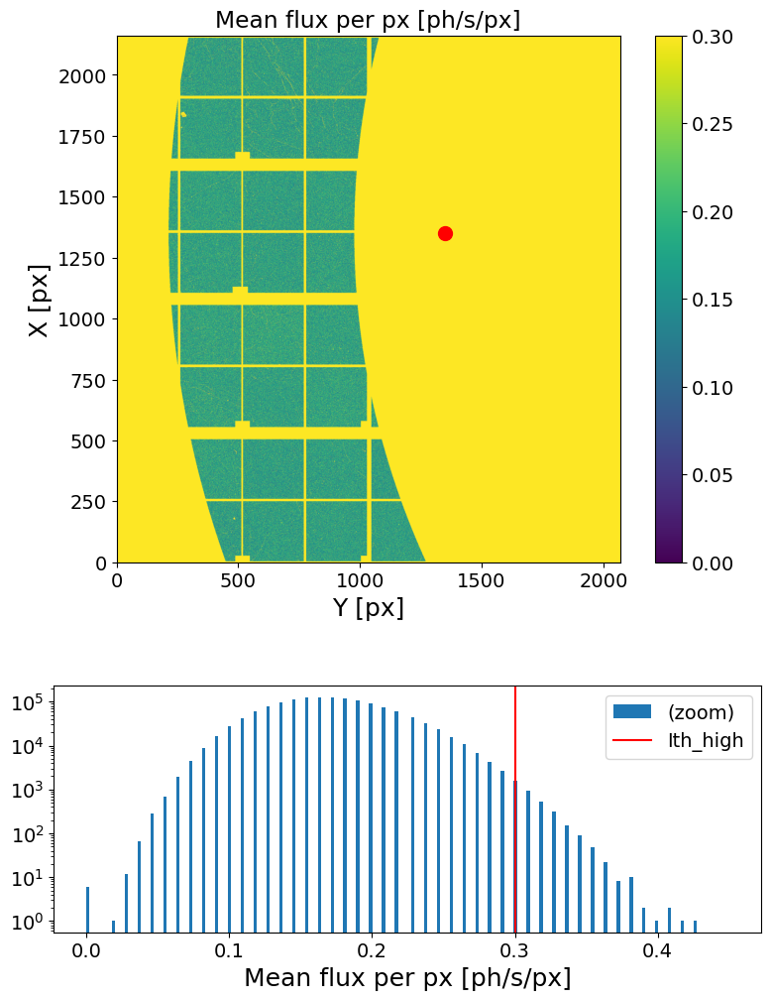

In [25]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [26]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

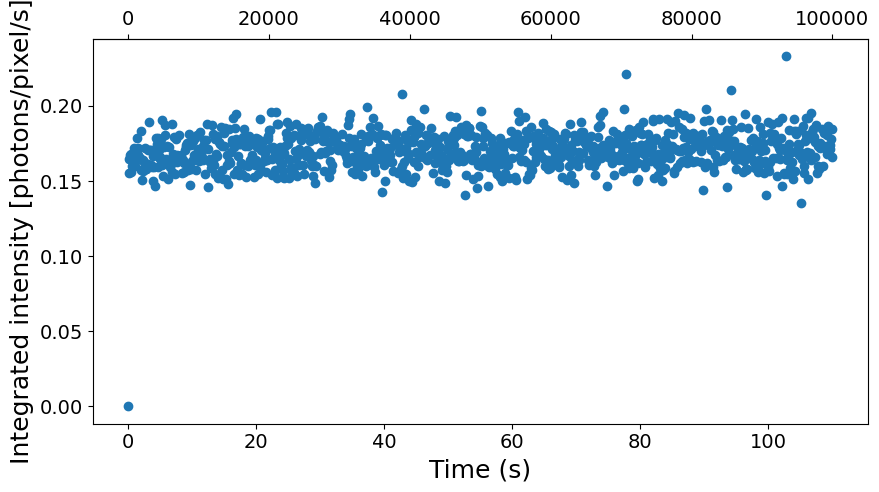

In [27]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [33]:
e4m_data_shape = int(scan['command'].split()[-1])
XPCS.print_Nf_choices(e4m_data_shape)

       Nf = 10799904    =>    log2(Nf) = 23.36
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**23                 22             22.3        2411296
1    5*2**21                 21              3.0         314144
2   41*2**18                 18              0.0          52000
3  329*2**15                 15              0.0          19232
4  659*2**14                 14              0.0           2848
----------------------------------------------------


In [33]:
##### INPUTS #####
Nfi = 100
Nff = 100 + 5*2**21
sparse_depth = 13
dense_depth = 21
mask = load_mask
##################

G2tmt = XPCS.get_G2tmt_4sparse_bypartialloading(raw_folder, sample_name, Ndataset, Nscan, sparse_depth, dense_depth, Nfi, Nff, mask=mask)

Computing sparse multitau G2t...


  0%|          | 2/1280 [00:01<17:18,  1.23it/s]

100%|██████████| 1280/1280 [20:39<00:00,  1.03it/s]


Done! (elapsed time = 1239.56 s)
Computing dense multitau G2t...


100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

Done! (elapsed time = 4.17 s)


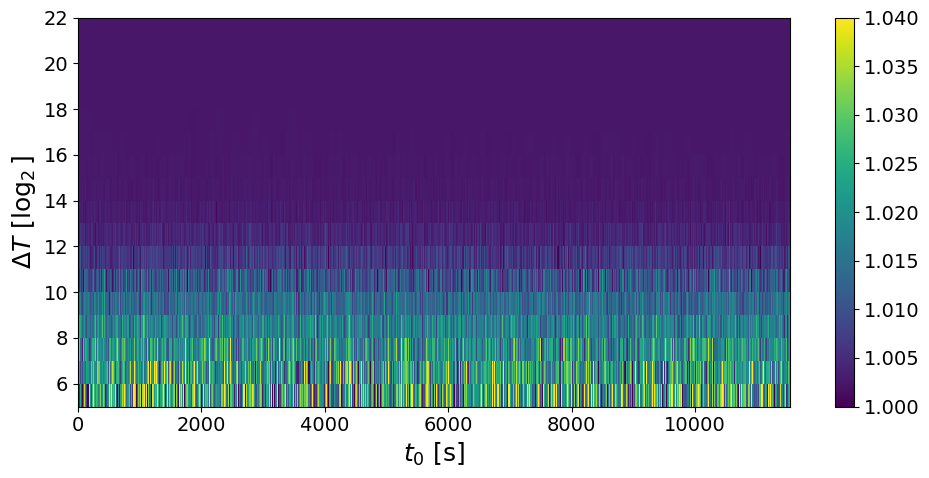

In [34]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [35]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


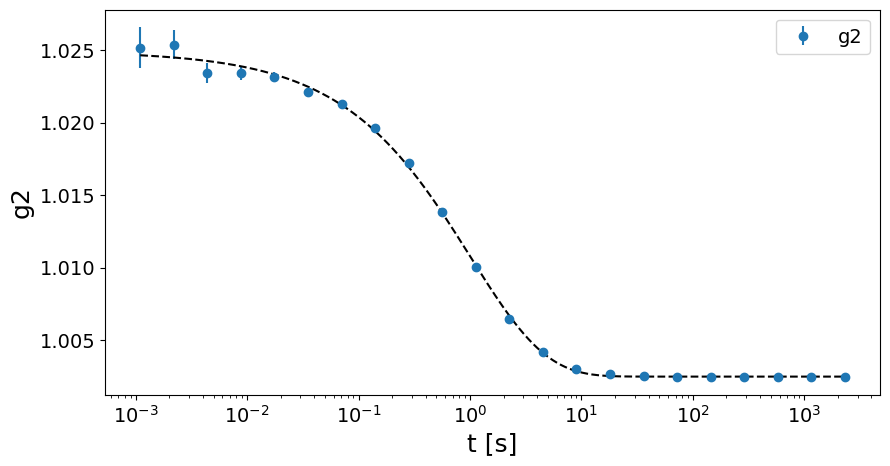

####### Fit parameters #######
tau = 1.0105 +/- 0.0442 s
beta = 0.6431 +/- 0.0258
c = 0.0225 +/- 0.0003
y0 = 1.0025 +/- 0.0001


In [36]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 660C Q =  0.19 Å, 180 min @ 1ms (10_800_000fm)) (GeO2_7, dataset 1, scan7)

In [38]:
#######################################
sample_name = 'GeO2_7_660C'
Ndataset = 1
Nscan = 7
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00037.h5 (38/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00038.h5 (39/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043932 pixels (of 4471016 => 68.08 %)
################################################################################



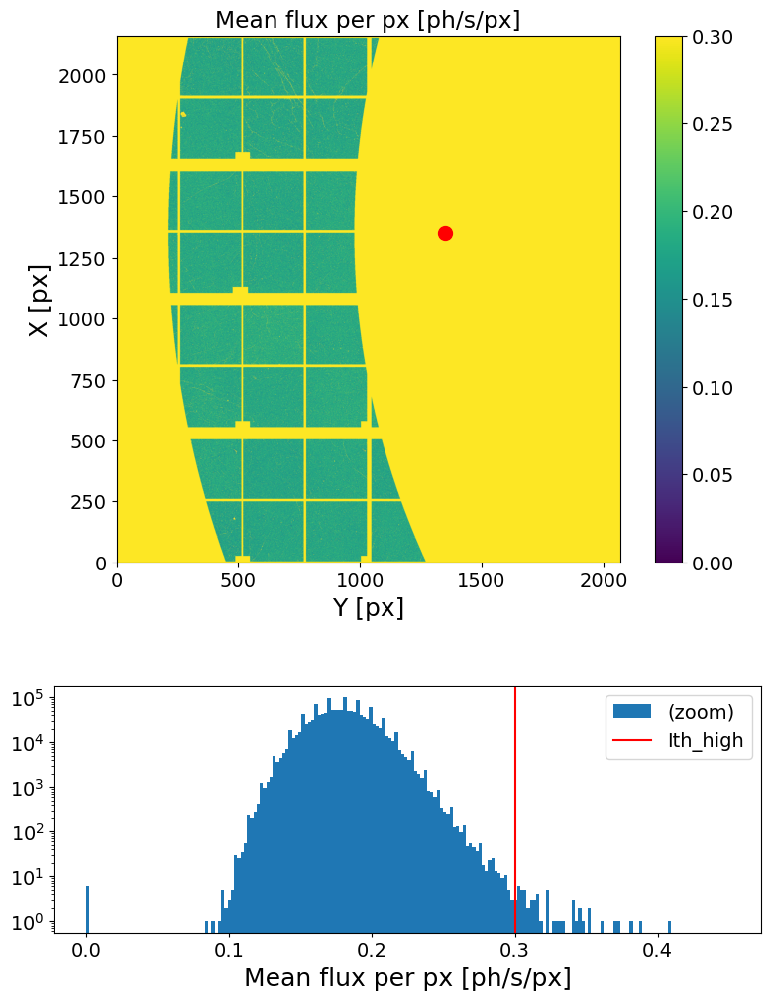

In [39]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [40]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

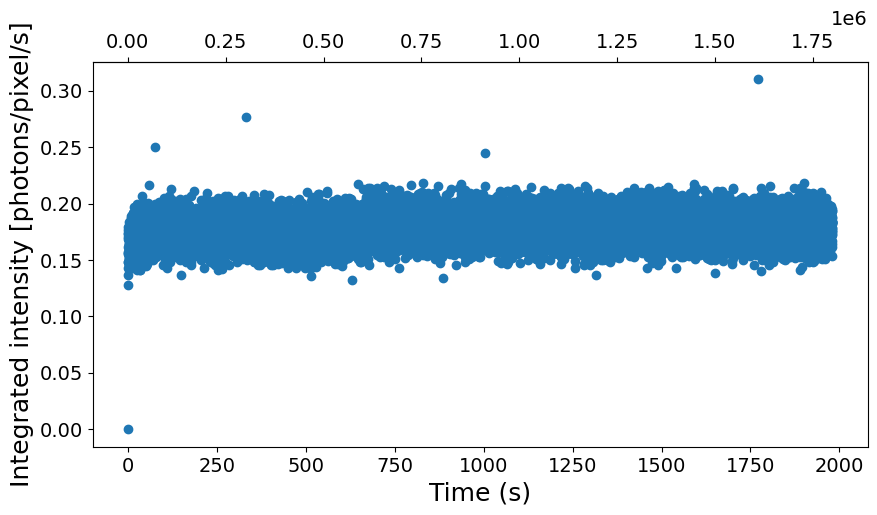

In [41]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [42]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 19             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [43]:
##### INPUTS #####
Nfi = 10_000
Nff = 10_000 + 3*2**19
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 6.11 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 1.96e-04
	 | memory usage (sparse.csr_array @ float32) = 4.917 GB
Computing sparse multitau G2t...


100%|██████████| 384/384 [00:46<00:00,  8.19it/s]


Done! (elapsed time = 46.92 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:01<00:00,  5.50it/s]

Done! (elapsed time = 2.45 s)


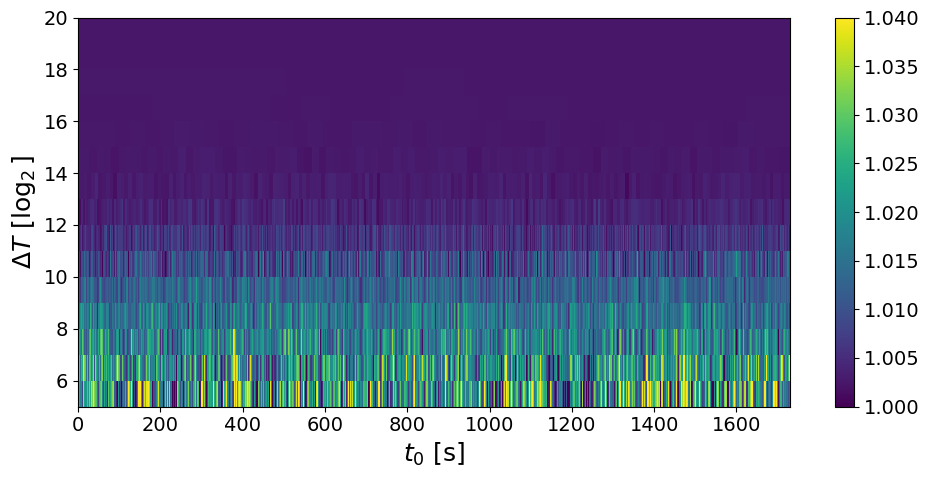

In [44]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [45]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

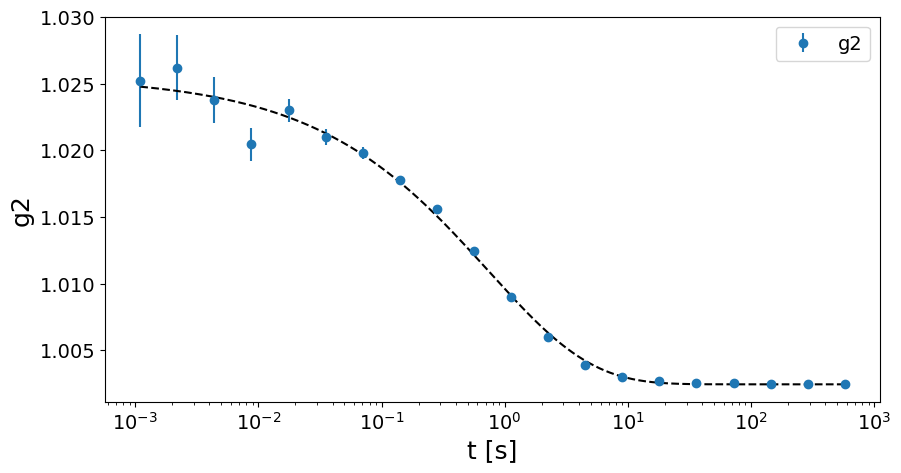

####### Fit parameters #######
tau = 0.7397 +/- 0.0987 s
beta = 0.5222 +/- 0.0549
c = 0.0231 +/- 0.0009
y0 = 1.0024 +/- 0.0004


In [46]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 660C Q =  0.19 Å, 180 min @ 1ms (10_800_000fm)) (GeO2_7, dataset 1, scan9)

In [46]:
#######################################
sample_name = 'GeO2_7_660C'
Ndataset = 1
Nscan = 9
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00041.h5 (42/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043893 pixels (of 4471016 => 68.08 %)
################################################################################



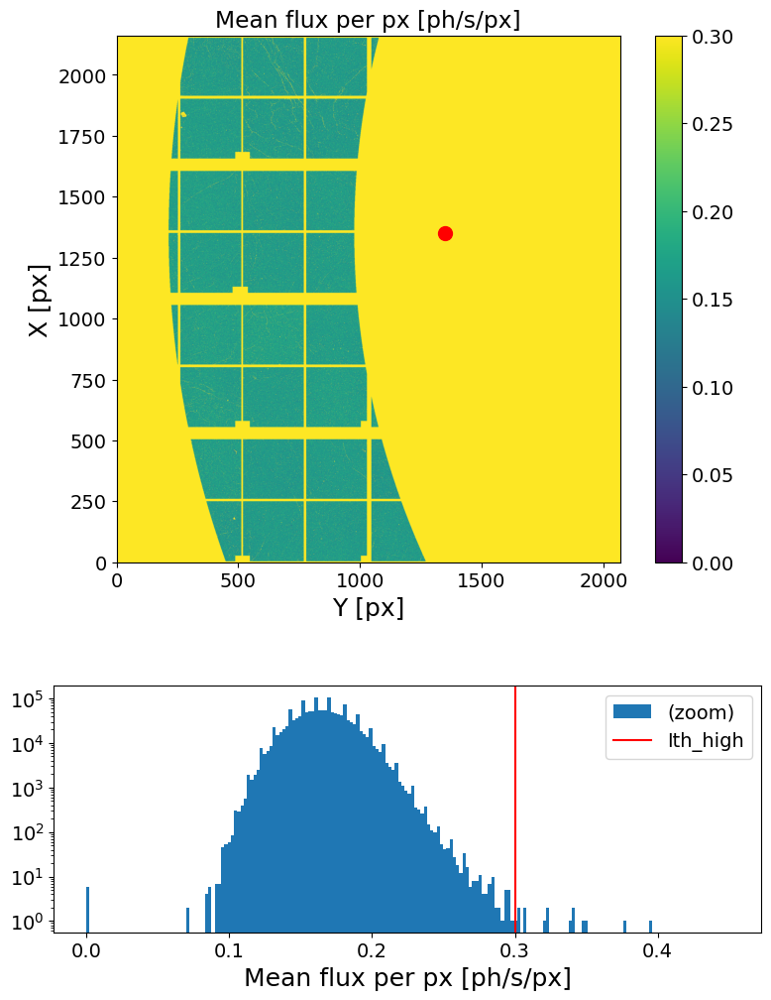

In [47]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [48]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

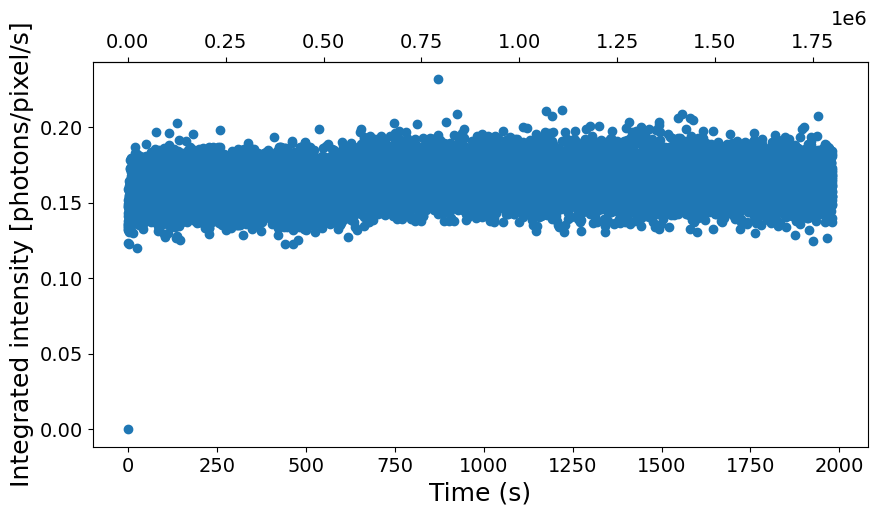

In [49]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [50]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 20             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [51]:
##### INPUTS #####
Nfi = 100
Nff = 100 + 3*2**19
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...


Done! (elapsed time = 5.67 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 4.518 GB
Computing sparse multitau G2t...


100%|██████████| 384/384 [00:43<00:00,  8.88it/s]


Done! (elapsed time = 43.27 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:01<00:00,  5.59it/s]

Done! (elapsed time = 2.34 s)


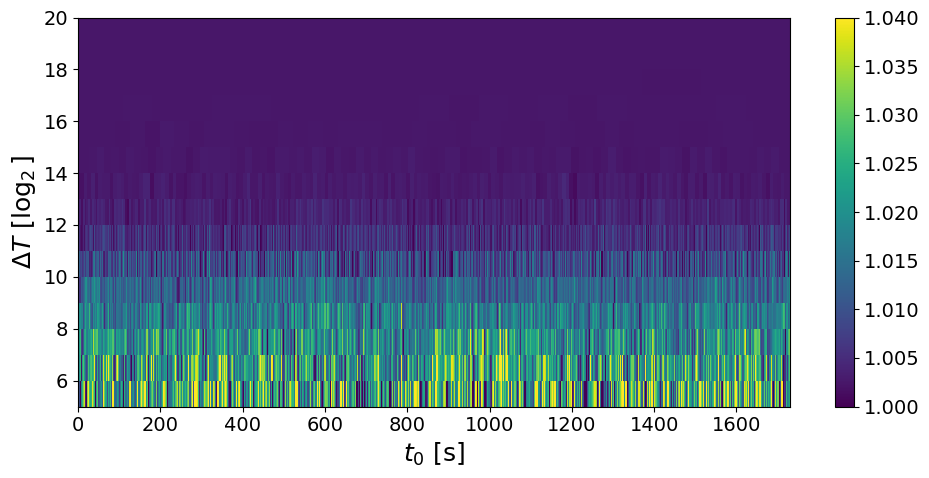

In [52]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [53]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

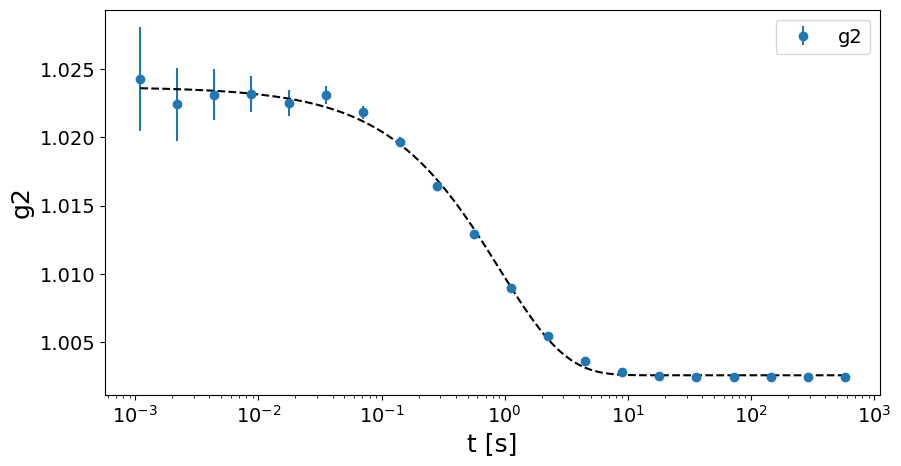

####### Fit parameters #######
tau = 0.9099 +/- 0.0492 s
beta = 0.8078 +/- 0.0471
c = 0.0211 +/- 0.0003
y0 = 1.0026 +/- 0.0002


In [54]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 660C Q =  0.19 Å, 240 min @ 1ms (14_400_000fm)) (GeO2_7, dataset 1, scan 4)

In [14]:
#######################################
sample_name = 'GeO2_7_660C'
Ndataset = 1
Nscan = 12
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...


	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00012.h5 (13/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043907 pixels (of 4471016 => 68.08 %)
################################################################################



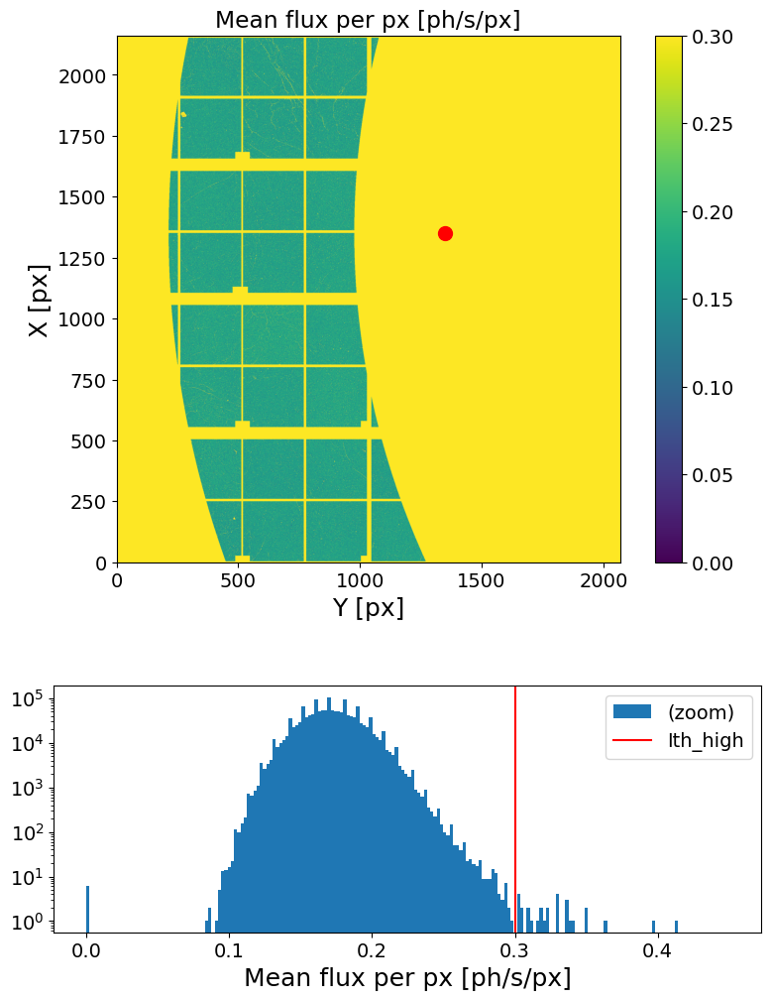

In [15]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [16]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

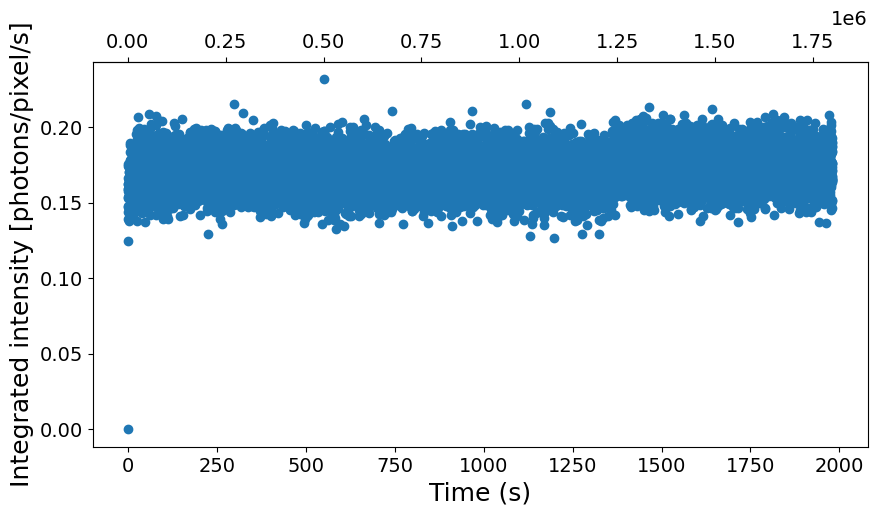

In [17]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [18]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 1800288    =>    log2(Nf) = 20.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 19             41.8         751712
1    3*2**19                 19             13.0         227424
2   13*2**17                 17              5.0          96352
3   27*2**16                 16              2.0          30816
4  109*2**14                 14              1.0          14432
5  219*2**13                 13              0.0           6240
6  439*2**12                 12              0.0           2144
7  879*2**11                 11              0.0             96
----------------------------------------------------


In [19]:
##### INPUTS #####
Nfi = 1
Nff = 1 + 3*2**19
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)


Loading frames ...
Done! (elapsed time = 5.66 s)
	 | 1572864 frames X 1427140 pixels
	 | sparsity = 1.88e-04
	 | memory usage (sparse.csr_array @ float32) = 4.724 GB
Computing sparse multitau G2t...


100%|██████████| 384/384 [00:46<00:00,  8.29it/s]


Done! (elapsed time = 46.33 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:01<00:00,  5.73it/s]

Done! (elapsed time = 2.34 s)


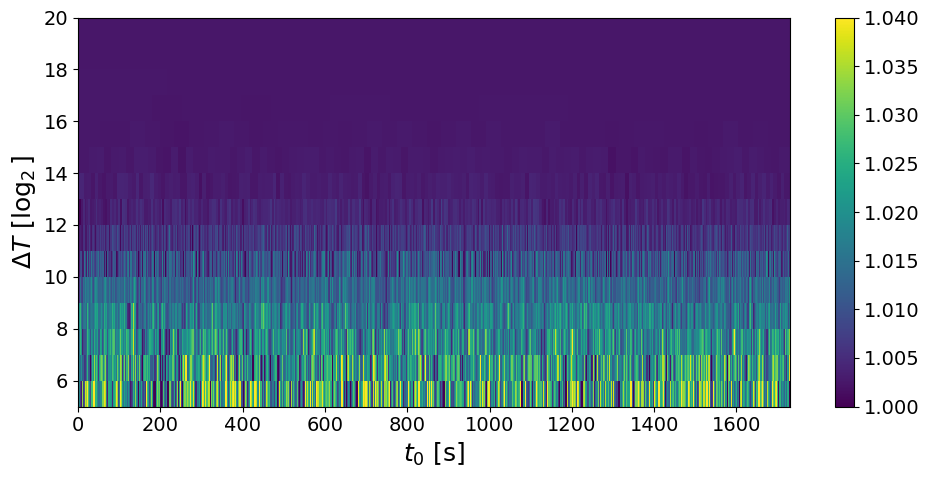

In [20]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [21]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

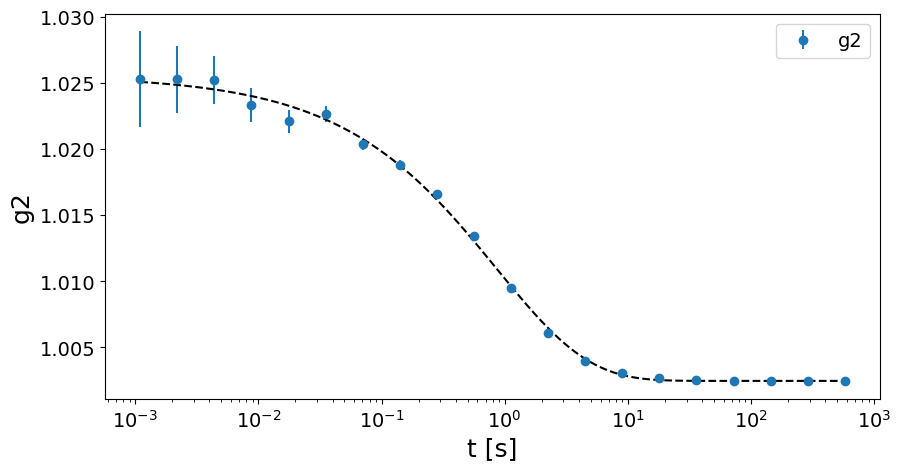

####### Fit parameters #######
tau = 0.8589 +/- 0.0531 s
beta = 0.5834 +/- 0.0307
c = 0.0231 +/- 0.0004
y0 = 1.0025 +/- 0.0002


In [22]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 695C Q =  0.19 Å, 240 min @ 1ms (14_400_000fm)) (GeO2_7, dataset 1, scan 4)

In [58]:
#######################################
sample_name = 'GeO2_7_695C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 14399568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00037.h5 (38/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00038.h5 (39/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/2580 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043904 pixels (of 4471016 => 68.08 %)
################################################################################



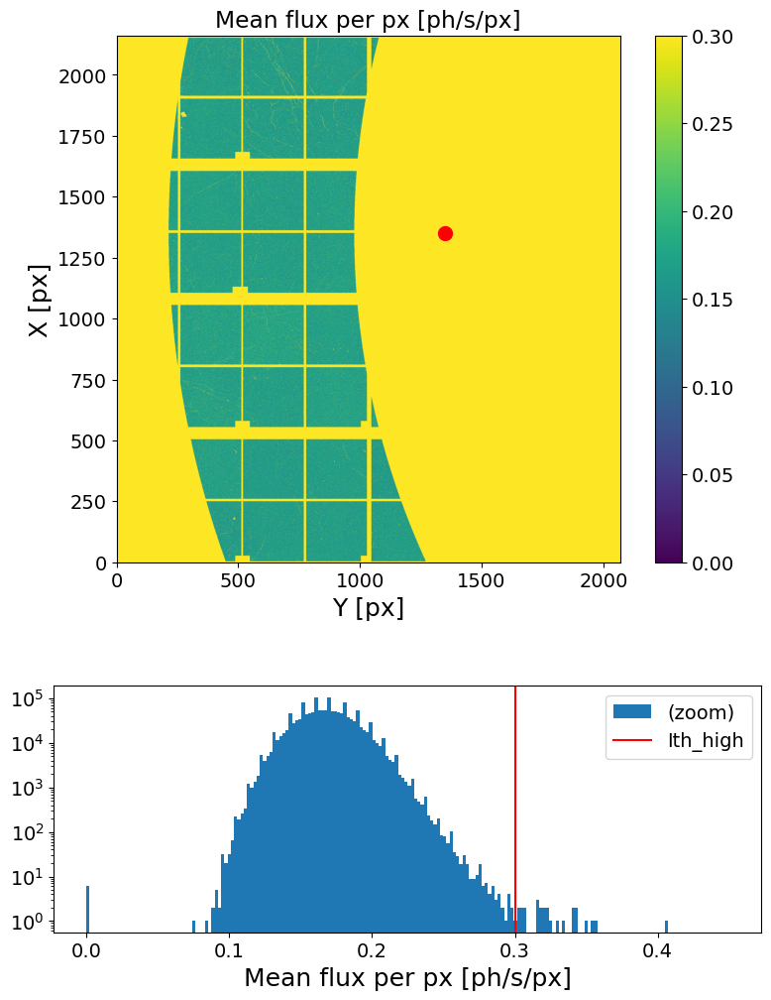

In [59]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [60]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

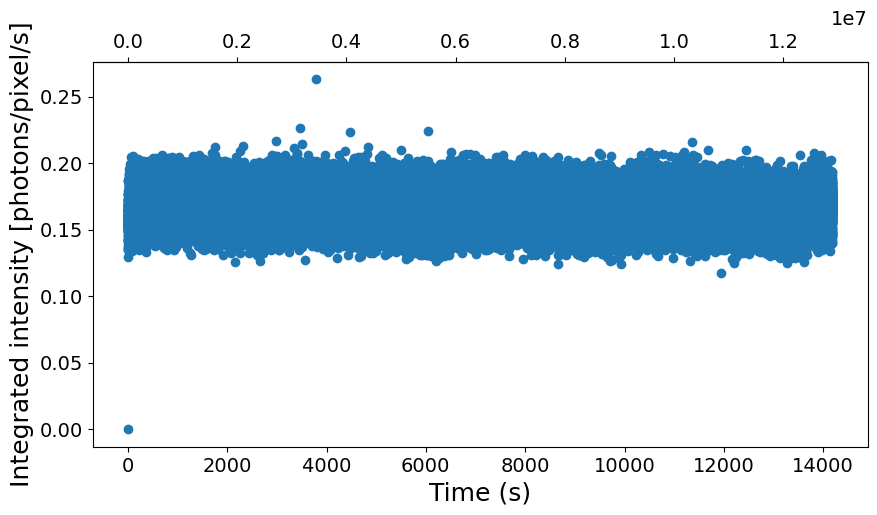

In [61]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [62]:
e4m_data_shape = int(scan['command'].split()[-1])
XPCS.print_Nf_choices(e4m_data_shape)

XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 14399568    =>    log2(Nf) = 23.78
----------------------------------------------------
   reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0       2**23                 22             41.7        6010960
1     3*2**22                 21             13.0        1816656
2    13*2**20                 19              5.0         768080
3    27*2**19                 18              2.0         243792
4   109*2**17                 16              1.0         112720
5   219*2**16                 15              0.0          47184
6   439*2**15                 14              0.0          14416
7  1757*2**13                 12              0.0           6224
----------------------------------------------------
       Nf = 12896237    =>    log2(Nf) = 23.62
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**23                 22             35.0        4507629
1    3*2**22                 21   

In [63]:
##### INPUTS #####
Nfi = 40_000
Nff = 40_000 + 3*2**22
sparse_depth = 14
dense_depth = 21
mask = load_mask
##################

G2tmt = XPCS.get_G2tmt_4sparse_bypartialloading(raw_folder, sample_name, Ndataset, Nscan, sparse_depth, dense_depth, Nfi, Nff, mask=mask)

Computing sparse multitau G2t...


100%|██████████| 768/768 [17:34<00:00,  1.37s/it]


Done! (elapsed time = 1055.87 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:01<00:00,  3.52it/s]

Done! (elapsed time = 1.99 s)


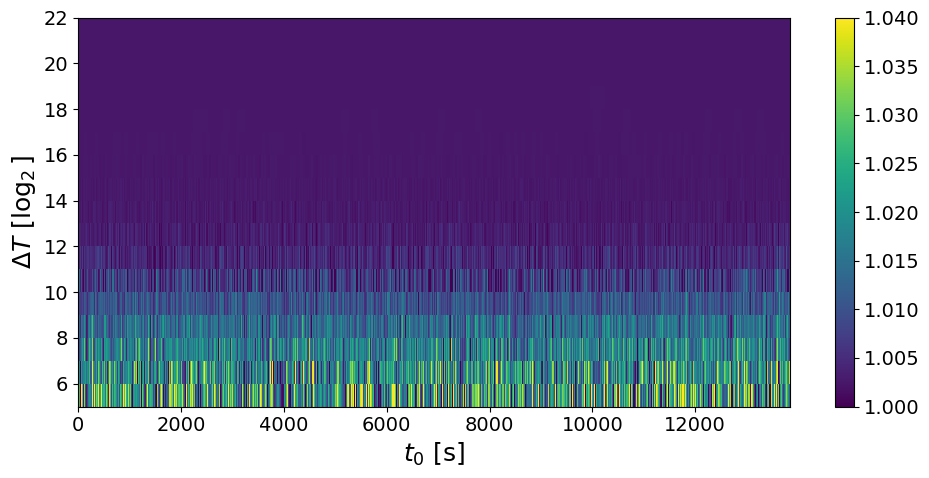

In [64]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [65]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

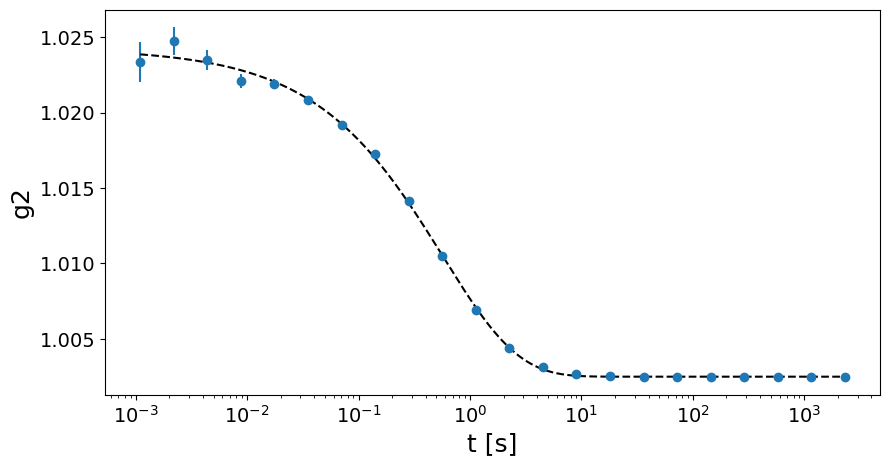

####### Fit parameters #######
tau = 0.5682 +/- 0.0252 s
beta = 0.6439 +/- 0.0271
c = 0.0218 +/- 0.0003
y0 = 1.0025 +/- 0.0001


In [67]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
#plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 730C Q =  0.19 Å, 240 min @ 1ms (14_400_000fm)) (GeO2_7, dataset 1, scan 4)

In [68]:
#######################################
sample_name = 'GeO2_7_730C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 14399568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00045.h5 (46/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00042.h5 (43/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/293 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/2

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043889 pixels (of 4471016 => 68.08 %)
################################################################################



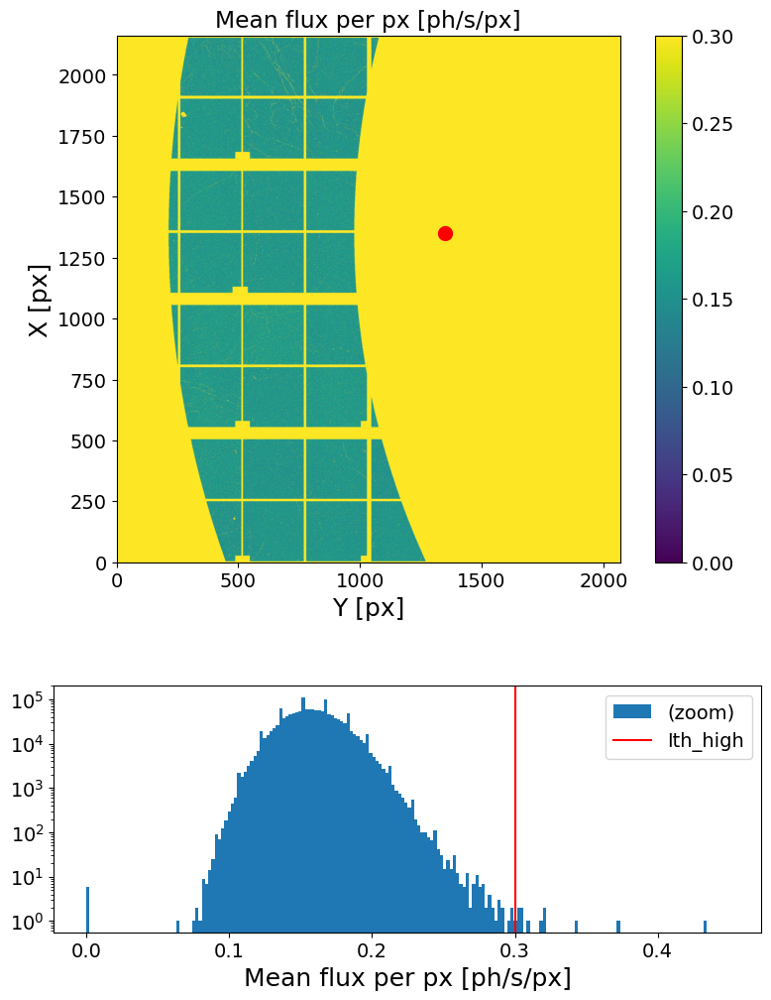

In [69]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff=int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [70]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

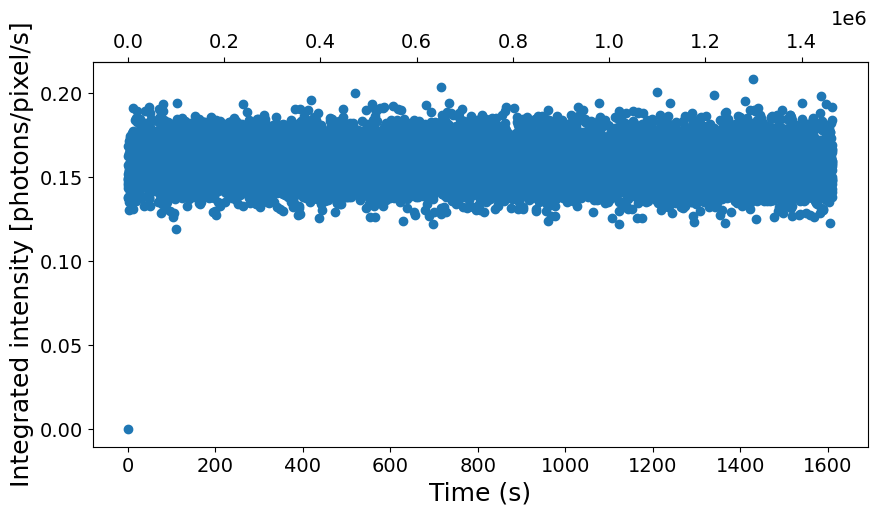

In [71]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [72]:
e4m_data_shape = int(scan['command'].split()[-1])
XPCS.print_Nf_choices(e4m_data_shape)

XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 14399568    =>    log2(Nf) = 23.78
----------------------------------------------------
   reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0       2**23                 22             41.7        6010960
1     3*2**22                 21             13.0        1816656
2    13*2**20                 19              5.0         768080
3    27*2**19                 18              2.0         243792
4   109*2**17                 16              1.0         112720
5   219*2**16                 15              0.0          47184
6   439*2**15                 14              0.0          14416
7  1757*2**13                 12              0.0           6224
----------------------------------------------------
       Nf = 1463833    =>    log2(Nf) = 20.48
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 19             28.4         415257
1    5*2**18                 17    

In [ ]:
##### INPUTS #####
Nfi = 40_000
Nff = 40_000 + 5*2**18
sparse_depth = 11
dense_depth = 17
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)

Loading frames ...
Done! (elapsed time = 2.09 s)
	 | 1310720 frames X 1427140 pixels
	 | sparsity = 1.75e-04
	 | memory usage (sparse.csr_array @ float32) = 3.673 GB
Computing sparse multitau G2t...


100%|██████████| 640/640 [00:36<00:00, 17.71it/s]


Done! (elapsed time = 36.14 s)
Computing dense multitau G2t...


100%|██████████| 6/6 [00:01<00:00,  3.89it/s]

Done! (elapsed time = 2.23 s)


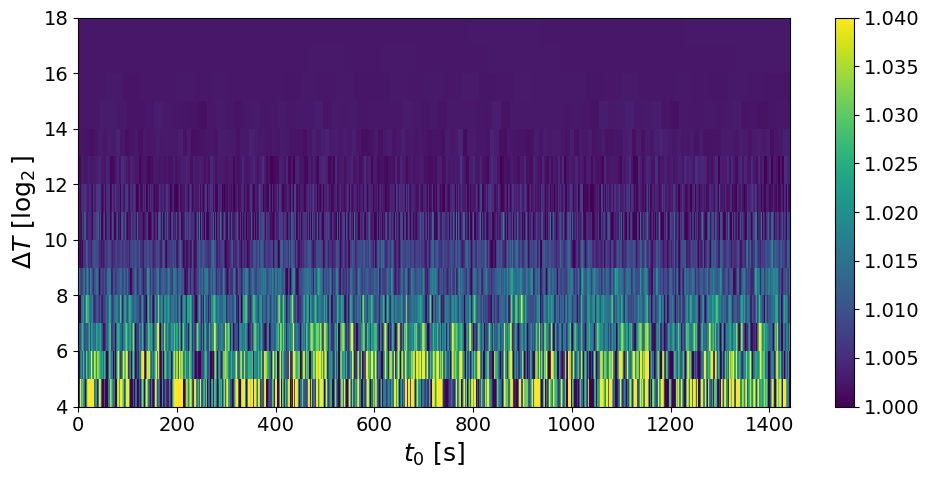

In [82]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 4
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [83]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

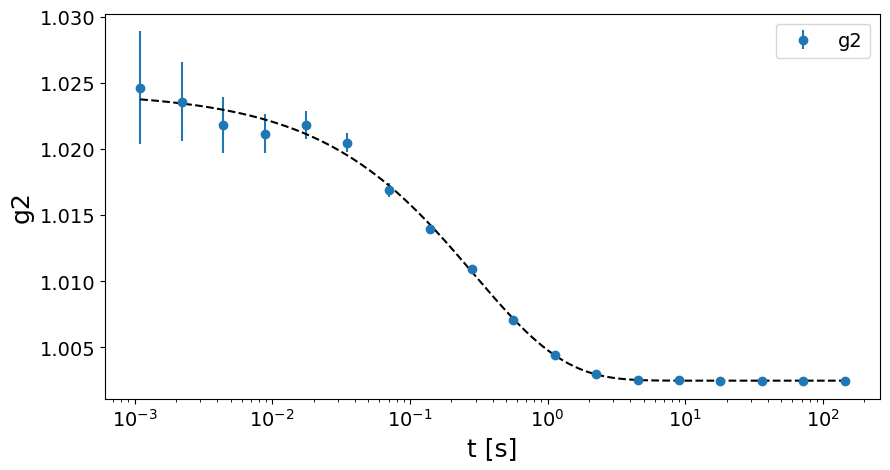

####### Fit parameters #######
tau = 0.293 +/- 0.023 s
beta = 0.6587 +/- 0.0507
c = 0.0218 +/- 0.0006
y0 = 1.0025 +/- 0.0002


In [84]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')  

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 660C Q =  0.19 Å, 60 min @ 1ms (3_600_000fm)) (GeO2_7, dataset 1, scan 4)

In [32]:
#######################################
sample_name = 'GeO2_7_660C'
Ndataset = 2
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/720 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/720 loop

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043907 pixels (of 4471016 => 68.08 %)
################################################################################



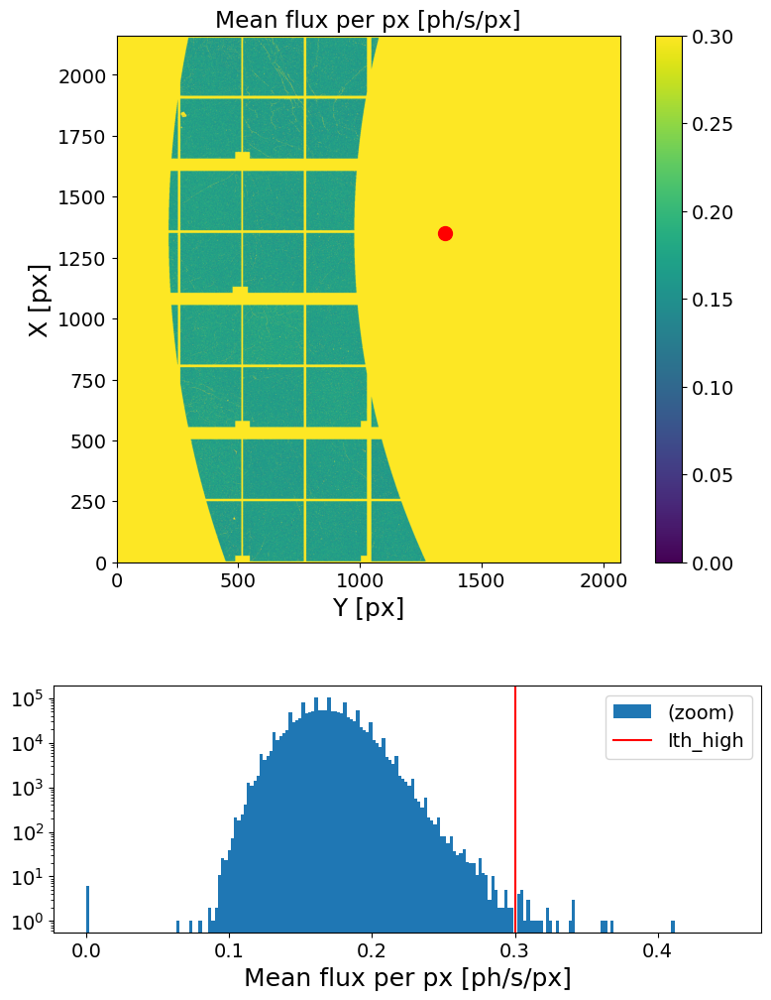

In [33]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=int(1e6), Nff= int(1.5e6), load_mask=load_mask)

### Intensity analysis

In [34]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

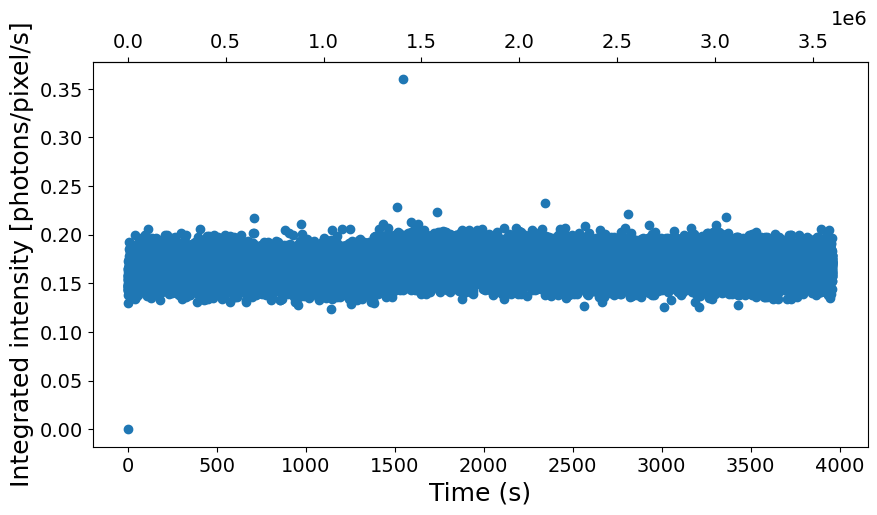

In [35]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [36]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 3599664    =>    log2(Nf) = 21.78
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**21                 20             41.7        1502512
1    3*2**20                 19             13.0         453936
2   13*2**18                 17              5.0         191792
3   27*2**17                 16              2.0          60720
4  109*2**15                 14              1.0          27952
5  219*2**14                 13              0.0          11568
6  439*2**13                 12              0.0           3376
----------------------------------------------------


In [37]:
##### INPUTS #####
Nfi = 40_000
Nff = 40_000 + 2**20
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)

Loading frames ...


Done! (elapsed time = 4.05 s)
	 | 1048576 frames X 1427140 pixels
	 | sparsity = 1.81e-04
	 | memory usage (sparse.csr_array @ float32) = 3.041 GB
Computing sparse multitau G2t...


100%|██████████| 256/256 [01:23<00:00,  3.08it/s]


Done! (elapsed time = 83.02 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:00<00:00,  8.80it/s]

Done! (elapsed time = 0.8 s)


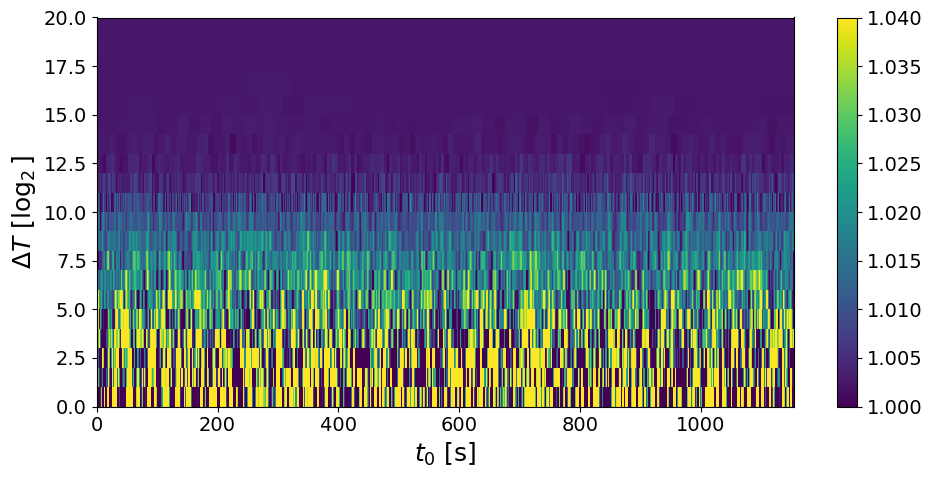

In [38]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 0
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [39]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)
np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

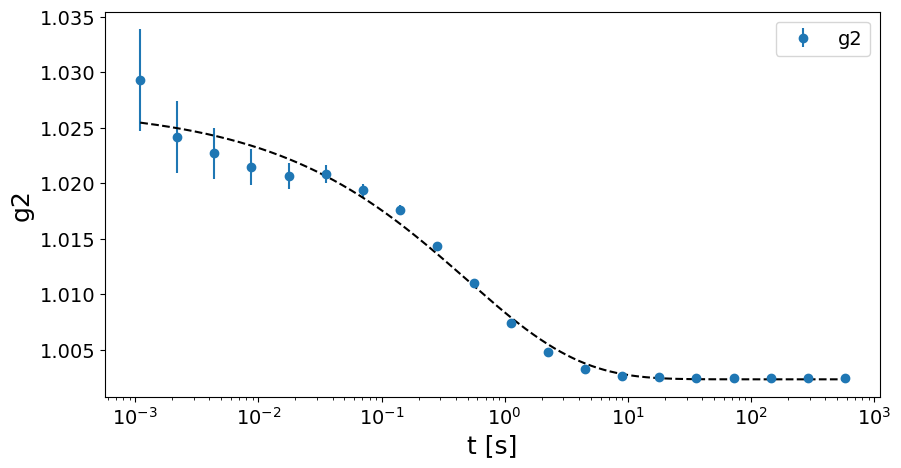

####### Fit parameters #######
tau = 0.4887 +/- 0.1065 s
beta = 0.4705 +/- 0.075
c = 0.0245 +/- 0.0016
y0 = 1.0024 +/- 0.0005


In [40]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')  

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 520C Q =  0.19 Å, 20 min @ 1ms (1_200_000fm)) (GeO2_7, dataset 1, scan 4)

In [19]:
#######################################
sample_name = 'GeO2_7_520C'
Ndataset = 2
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
num_frames = scan['fast_timer_trig'].size
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('number of frames = ', num_frames)
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=2)

#############################
command = mtimescan 0.001 1 1200192
number of frames =  1200192
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...


	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00036.h5 (37/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (

### Flux check

################################################################################
Maximum count in the hull run -> 2.0
# of pixels above Ith_high treshold ->  3043893 pixels (of 4471016 => 68.08 %)
################################################################################



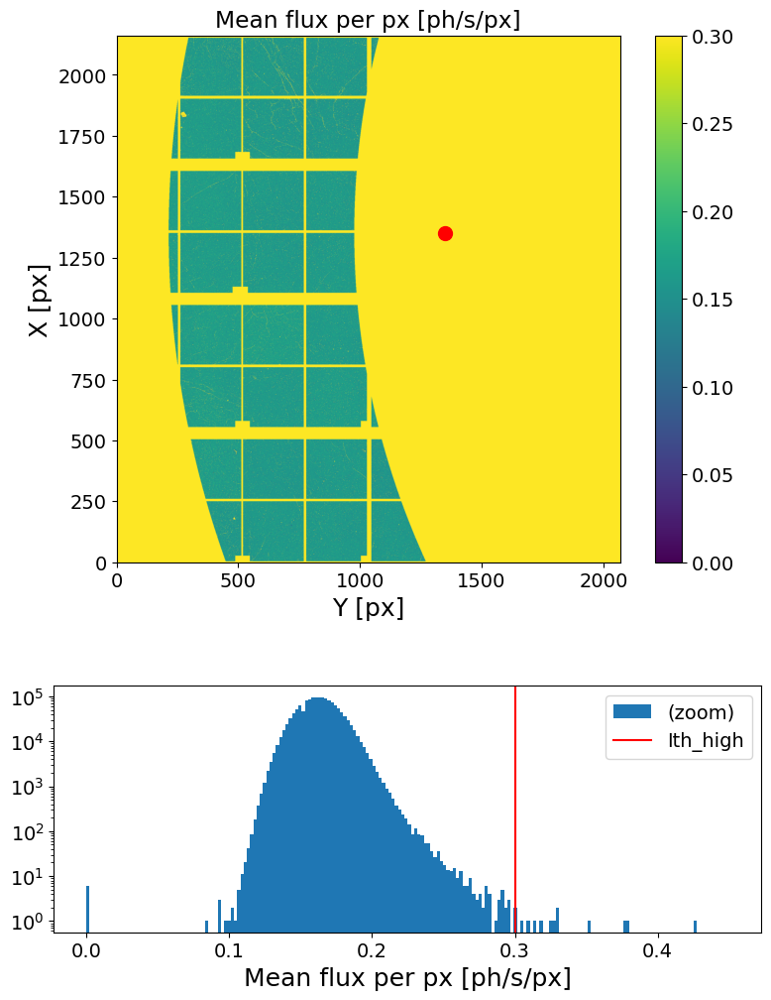

In [20]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [21]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

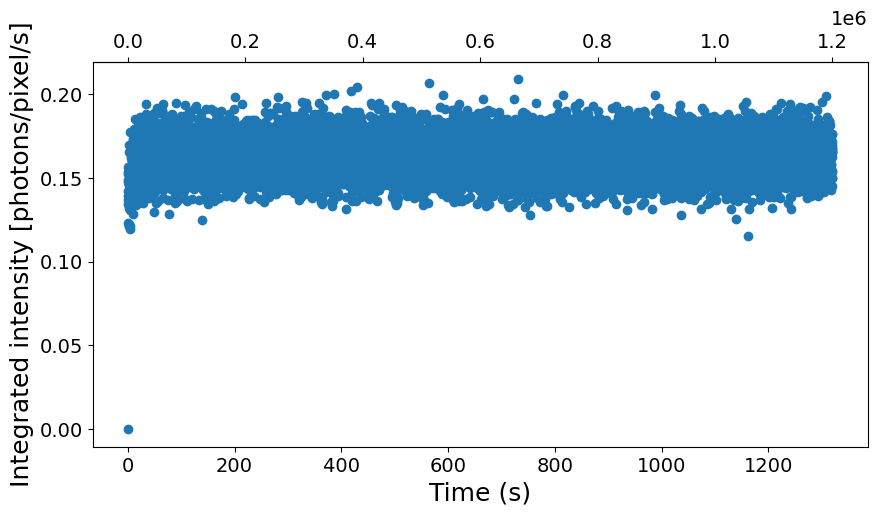

In [22]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [23]:
XPCS.print_Nf_choices(num_frames)

       Nf = 1200192    =>    log2(Nf) = 20.19
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**20                 19             12.6         151616
1    9*2**17                 16              2.0          20544
2   73*2**14                 13              0.0           4160
3  293*2**12                 11              0.0             64
----------------------------------------------------


In [24]:
##### INPUTS #####
Nfi = 40_000
Nff = 40_000 + 2**20
sparse_depth = 12
dense_depth = 19
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
############################
vmin, vmax = 1.0, 1.04
lower_mt = 0
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

Loading frames ...
Done! (elapsed time = 3.8 s)
	 | 1048576 frames X 1427140 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 3.015 GB
Computing sparse multitau G2t...


100%|██████████| 256/256 [00:29<00:00,  8.64it/s]


Done! (elapsed time = 29.67 s)
Computing dense multitau G2t...


100%|██████████| 7/7 [00:00<00:00,  7.41it/s]

Done! (elapsed time = 0.95 s)


In [26]:
cut1 = XPCS.cut_G2tmt(itime,G2tmt,  400,1200)
#cut1 = XPCS.cut_G2tmt(itime,G2tmt1, 200,1200)

In [27]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)
t_mt1, g2_mt1, dg2_mt1 = XPCS.get_g2mt(itime, cut1)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

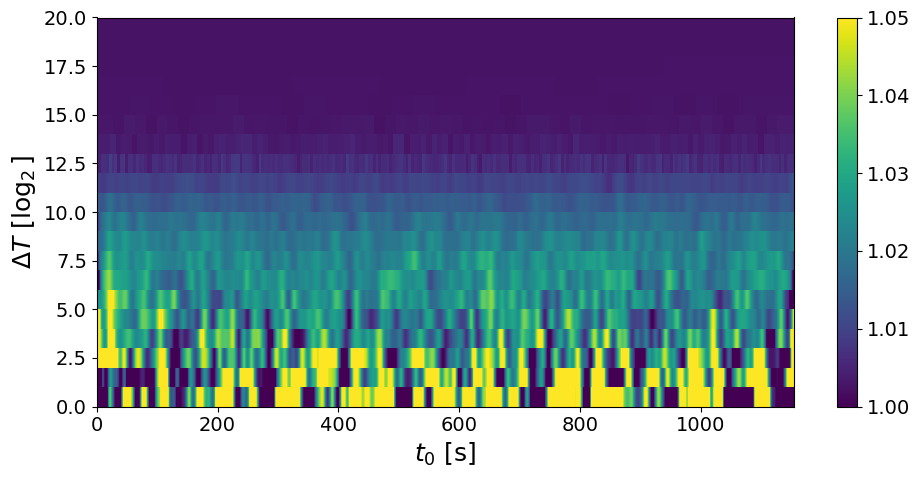

In [31]:
############################
vmin, vmax = 1.0, 1.05
lower_mt = 0
filter_layer = 12
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

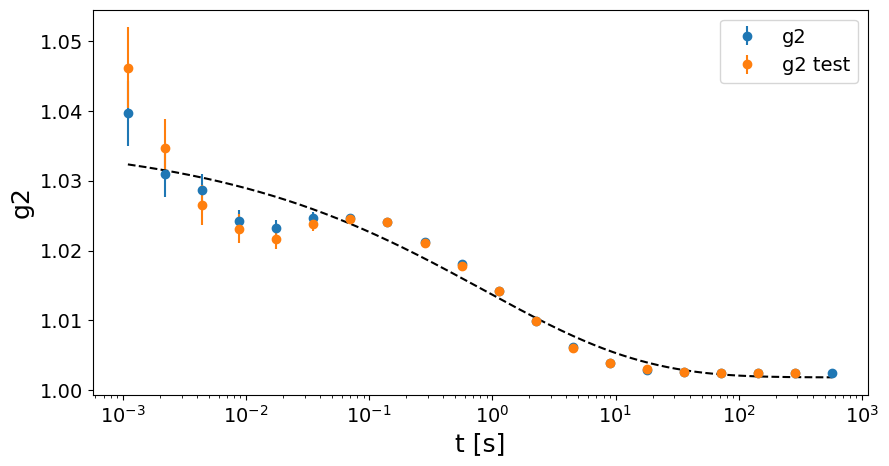

####### Fit parameters #######
tau = 0.8491 +/- 0.4642 s
beta = 0.3335 +/- 0.097
c = 0.034 +/- 0.0052
y0 = 1.0019 +/- 0.0015


In [28]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')
plt.errorbar(t_mt1, g2_mt1, yerr=dg2_mt1, fmt='o', label='g2 test')   

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

### Comparison with linear G2t

### Correlation

In [19]:
###################
Nfi = 40_000
Nff = None
Lbin = None
Nbunch = 10
mask =  None
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 40000 , Nff = 156019 ) ...
Loading frames ...


Done! (elapsed time = 0.54 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 5.64 s)
	 | 116019 X 116019 squared matrix
	 | memory usage (np.array @ float32) = 50.144 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 5.39 s)

Done!

Computing G2t for bunch 2 (Nfi = 156019 , Nff = 272038 ) ...
Loading frames ...
Done! (elapsed time = 0.3 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 5.39 s)
	 | 116019 X 116019 squared matrix
	 | memory usage (np.array @ float32) = 50.144 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 8.7 s)

Done!

Computing G2t for bunch 3 (Nfi = 272038 , Nff = 388057 ) ...
Loading frames ...
Done! (elapsed time = 0.31 s)
Computing G2t (using MKL library)...
Done! (elapsed time = 5.25 s)
	 | 116019 X 116019 squared matrix
	 | memory usage (np.array @ float32) = 50.144 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 8.99 s)

Done!

Computing G2t for bunch 4 (Nfi = 388057 , Nff = 50407

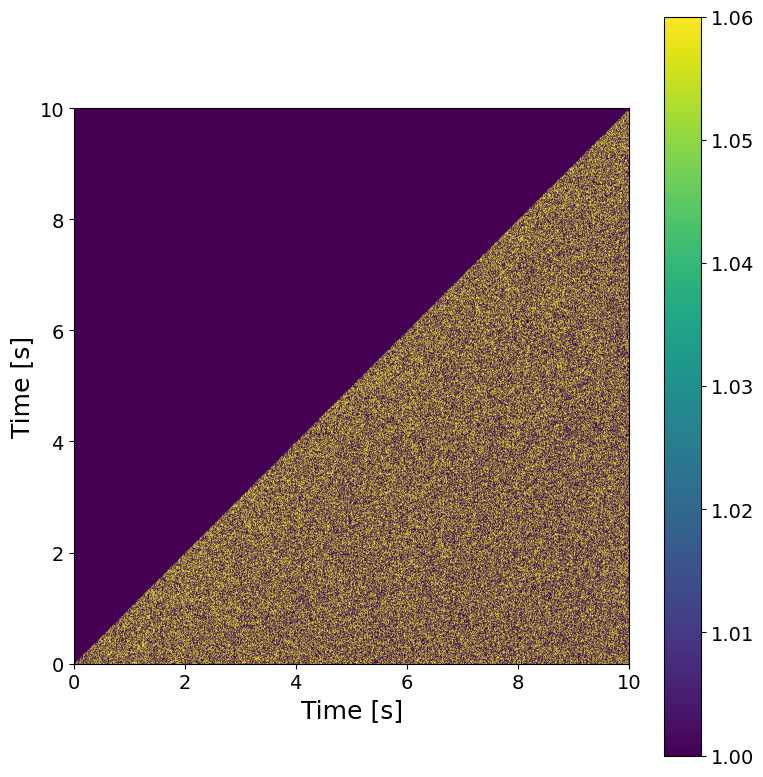

In [20]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [22]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2mt_fromling2(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 34.2 s)



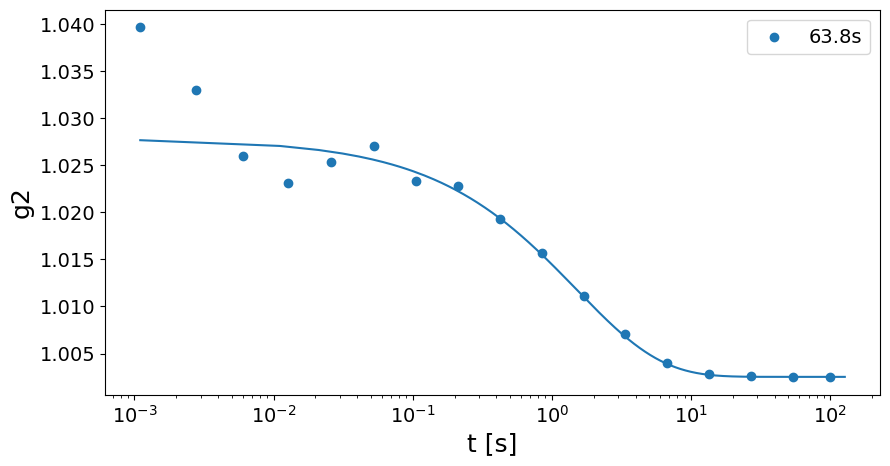

tau = 1.4994499655554212 +/- 0.18140895369181842
beta = 0.7111345808694951 +/- 0.05769487308914006
c = 0.02528790601268898 +/- 0.0016934760329278058
y0 = 1.0025229250371297 +/- 4.601714135486392e-05


In [24]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorrelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-2)
    y = decorrelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (T = 300C Q =  0.19 Å, 10 min @ 1ms (600_000fm)) (GeO2_7, dataset 1, scan 4)

In [31]:
#######################################
sample_name = 'GeO2_7_300C'
Ndataset = 1
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 600096
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00041.h5 (42/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00042.h5 (43/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/121 l

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3043944 pixels (of 4471016 => 68.08 %)
################################################################################



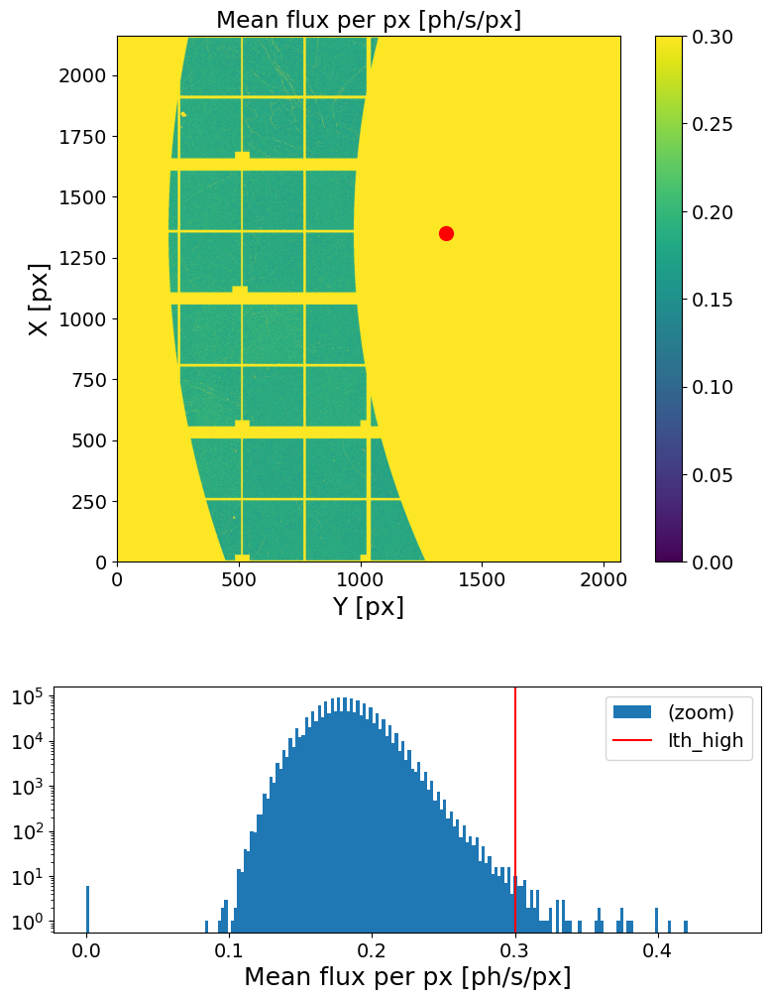

In [32]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [33]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

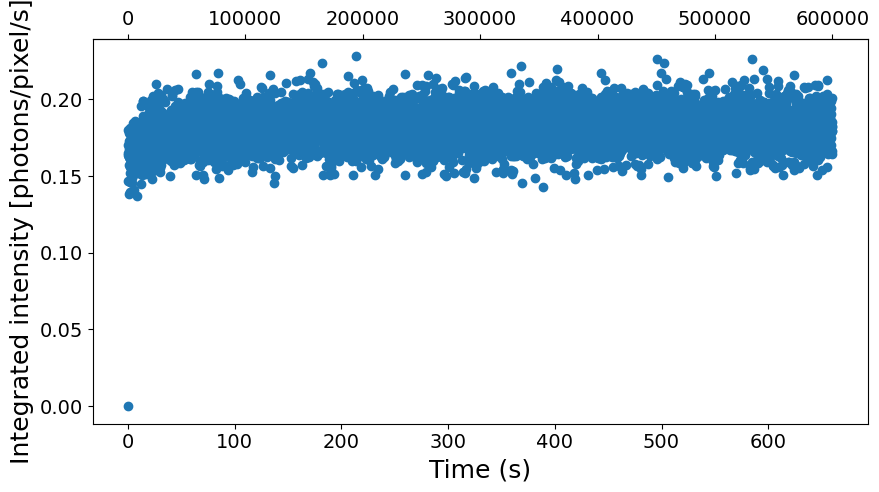

In [34]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [35]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 600096    =>    log2(Nf) = 19.19
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**19                 18             12.6          75808
1    9*2**16                 15              2.0          10272
2   73*2**13                 12              0.0           2080
3  293*2**11                 10              0.0             32
----------------------------------------------------


In [36]:
##### INPUTS #####
Nfi = 50_000
Nff = 50_000 + 2**19
sparse_depth = 12
dense_depth = 18
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)
G2tmt1 =XPCS.get_G2tmt_4sparse_test(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)

Loading frames ...
Done! (elapsed time = 2.24 s)
	 | 524288 frames X 1427140 pixels
	 | sparsity = 2.00e-04
	 | memory usage (sparse.csr_array @ float32) = 1.676 GB
Computing sparse multitau G2t...


100%|██████████| 128/128 [00:38<00:00,  3.33it/s]


Done! (elapsed time = 38.49 s)
Computing dense multitau G2t...


100%|██████████| 6/6 [00:00<00:00, 14.38it/s]


Done! (elapsed time = 0.79 s)
Loading frames ...
Done! (elapsed time = 1.61 s)
	 | 524288 frames X 1427140 pixels
	 | sparsity = 2.00e-04
	 | memory usage (sparse.csr_array @ float32) = 1.676 GB
Computing sparse multitau G2t...


100%|██████████| 128/128 [00:40<00:00,  3.15it/s]


Done! (elapsed time = 40.92 s)
Computing dense multitau G2t...


100%|██████████| 6/6 [00:00<00:00, 15.67it/s]

Done! (elapsed time = 0.39 s)


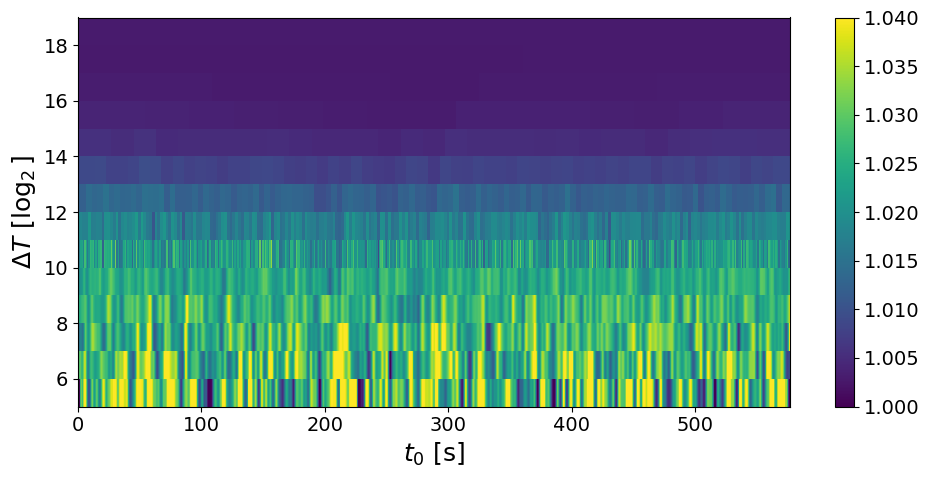

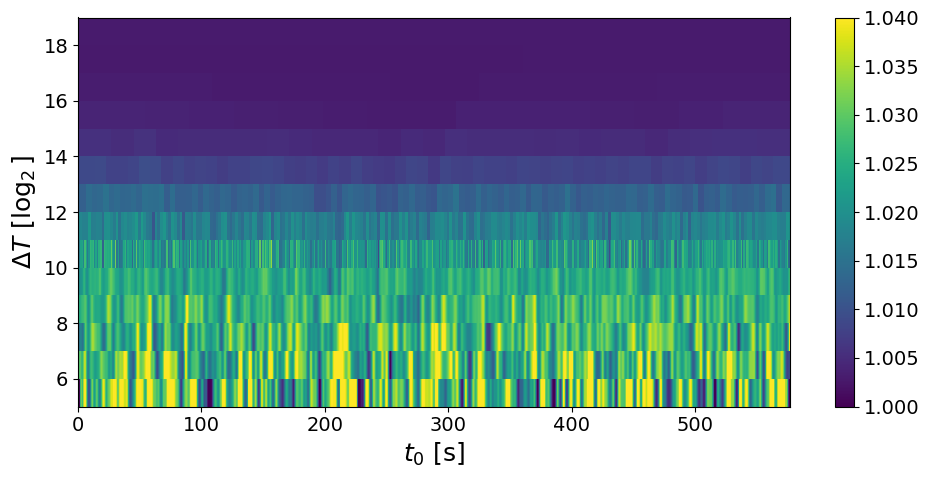

In [37]:
############################
vmin, vmax = 1.0, 1.04
lower_mt = 5
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)
XPCS.plot_G2tmt(G2tmt1, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer)

In [ ]:
cut = XPCS.cut_G2tmt(itime,G2tmt,  200,1200)
cut1 = XPCS.cut_G2tmt(itime,G2tmt1, 200,1200)

In [38]:
t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt)
t_mt1, g2_mt1, dg2_mt1 = XPCS.get_g2mt(itime, G2tmt1)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

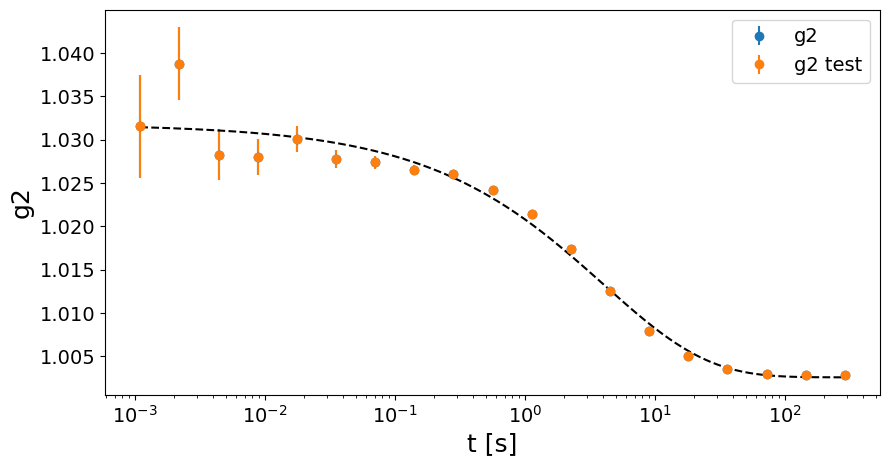

####### Fit parameters #######
tau = 4.0065 +/- 1.122 s
beta = 0.5416 +/- 0.1059
c = 0.0292 +/- 0.0021
y0 = 1.0026 +/- 0.0014


In [39]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')
plt.errorbar(t_mt1, g2_mt1, yerr=dg2_mt1, fmt='o', label='g2 test')   

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')

## XPCS scan (T = 30C Q =  0.19 Å, 10 min @ 1ms (600_000fm)) (GeO2_7, dataset 1, scan 4)

In [32]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 4
Nscan = 4
Nfi, Nff = None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 600096
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00013.h5 (14/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00044.h5 (45/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00041.h5 (42/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/121 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/121 l

### Flux check

################################################################################
Maximum count in the hull run -> 5.0
# of pixels above Ith_high treshold ->  3044110 pixels (of 4471016 => 68.09 %)
################################################################################



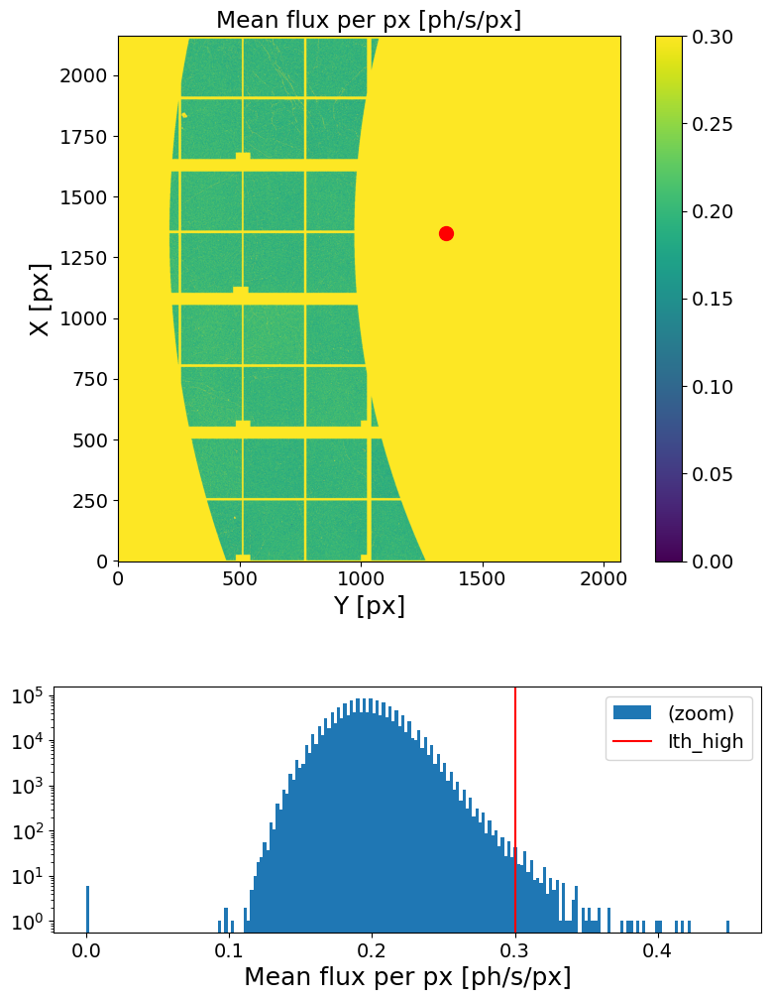

In [33]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.3, Nfi=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [34]:
####################
Lbin = 1
Nstep = 100
mask = None
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idt_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

<SecondaryAxis: >

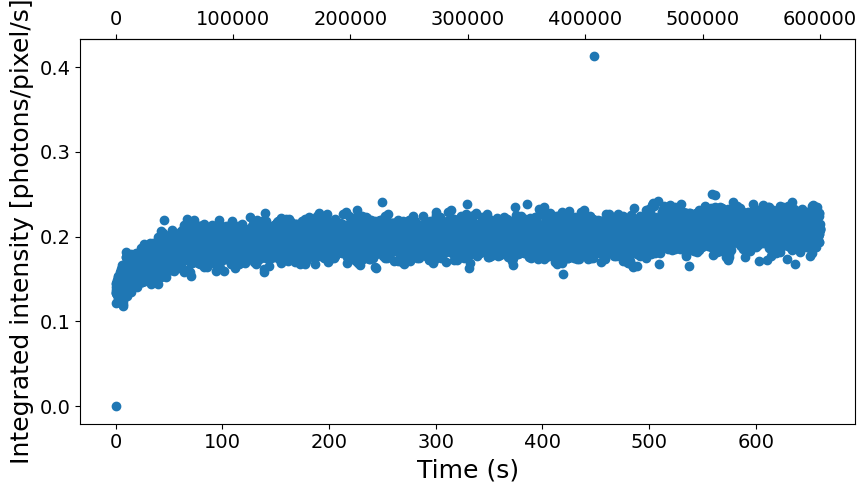

In [35]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Correlation

In [36]:
XPCS.print_Nf_choices(e4m_data.shape[0])

       Nf = 600096    =>    log2(Nf) = 19.19
----------------------------------------------------
  reduced Nf  dense depth (2^x)  thrown frames %  thrown frames
0      2**19                 18             12.6          75808
1    9*2**16                 15              2.0          10272
2   73*2**13                 12              0.0           2080
3  293*2**11                 10              0.0             32
----------------------------------------------------


In [37]:
##### INPUTS #####
Nfi = 0 #50_000
Nff = 2**19 + 0
sparse_depth = 12
dense_depth = 18
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, dense_depth=dense_depth, mask=mask, Nfi=Nfi, Nff=Nff)

Loading frames ...
Done! (elapsed time = 2.72 s)
	 | 524288 frames X 1427140 pixels
	 | sparsity = 2.15e-04
	 | memory usage (sparse.csr_array @ float32) = 1.798 GB
Computing sparse multitau G2t...


100%|██████████| 128/128 [00:17<00:00,  7.23it/s]


Done! (elapsed time = 17.83 s)
Computing dense multitau G2t...


100%|██████████| 6/6 [00:00<00:00, 11.93it/s]

Done! (elapsed time = 0.5 s)


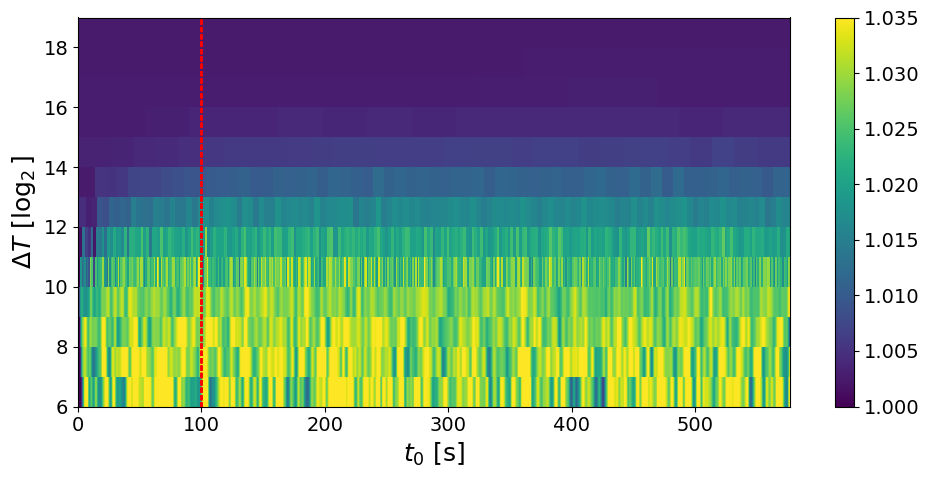

In [42]:
############################
vmin, vmax = 1.0, 1.035
lower_mt = 6
filter_layer = 10
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log2', lower_mt=lower_mt, filter_layer=filter_layer, vlines=[100])

In [44]:
G2tmt_cut = XPCS.cut_G2tmt(itime,G2tmt, 200,None)

t_mt, g2_mt, dg2_mt = XPCS.get_g2mt(itime, G2tmt_cut)

np.savez(g2_folder+'g2_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_mt=t_mt, g2_mt=g2_mt, dg2_mt=dg2_mt)

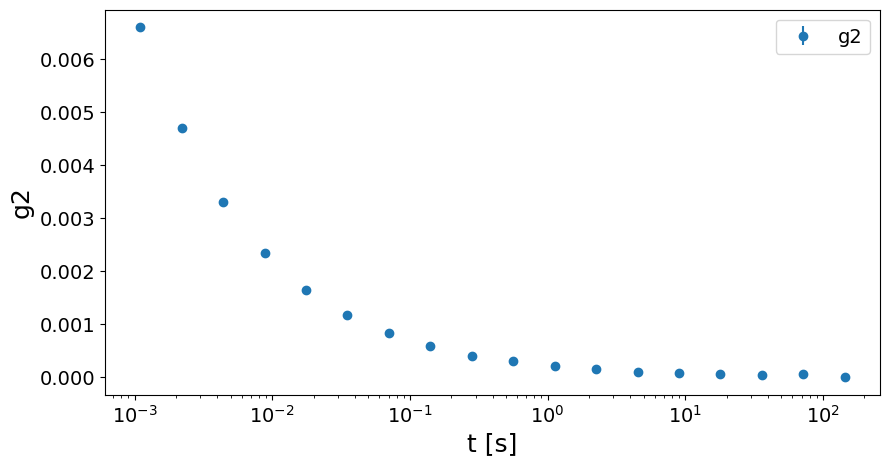

####### Fit parameters #######
tau = 6.975 +/- 1.393 s
beta = 0.8621 +/- 0.1642
c = 0.0272 +/- 0.0016
y0 = 1.0031 +/- 0.0013


In [ ]:
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'

plt.errorbar(t_mt, g2_mt, yerr=dg2_mt, fmt='o', label='g2')  

popt, pcov = curve_fit(decorrelation_f, t_mt, g2_mt, sigma=None, p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf])) # TO BOUND THE FIT: t1_fit, t2_fit = 0, 1e10,  t[k] ->  t[k][(t1_fit<t[k])*(t[k]<t2_fit)]; g2[k] ->  g2[k][(t1_fit<t[k])*(t[k]<t2_fit)]
fit_out.loc[G2tmt[0].size*itime/2] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
fit_out.to_csv(fit_out_folder+'fit_out_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4)+'.csv')

X = np.arange(np.min(t_mt), np.max(t_mt), 1e-4)
Y = decorrelation_f(X, *popt)
plt.plot(X, Y, c='black', ls='--')

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

print('####### Fit parameters #######')
print(f'tau = { round(popt[0],4)} +/- {round(np.sqrt(pcov[0,0]),4)} s')
print(f'beta = {round(popt[1],4)} +/- {round(np.sqrt(pcov[1,1]),4)}')
print(f'c = {   round(popt[2],4)} +/- {round(np.sqrt(pcov[2,2]),4)}')
print(f'y0 = {  round(popt[3],4)} +/- {round(np.sqrt(pcov[3,3]),4)}')